In [1]:
!pip install numba==0.53.1 numpy==1.20.1 pandas==1.2.4 tensorflow==2.11.0 nltk matplotlib shap torch sklearn yellowbrick transformers dill

In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf
import nltk
import nltk.corpus
import re
import matplotlib.pyplot as plt
import torch
import shap
import dill

from sklearn.feature_extraction.text import CountVectorizer
from yellowbrick.text import FreqDistVisualizer
from sklearn.model_selection import train_test_split
from sklearn import neural_network

from transformers import BertTokenizer, BertModel
from sklearn.preprocessing import LabelEncoder

tf.get_logger().setLevel('ERROR')

2023-03-29 08:58:48.862493: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-29 08:58:49.715353: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-03-29 08:58:49.715450: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2023-03-29 08:58:49.715460: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nv

In [3]:
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/bkapteijns/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/bkapteijns/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /home/bkapteijns/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [4]:
df = pd.read_csv("ecommerceDataset.csv", header=None)
print(np.sum(df[1].isna()))
df = df.dropna()
print(np.sum(df[1].isna()))
df.head()

1
0


,0,1
0,Household,Paper Plane Design Framed Wall Hanging Motivat...
1,Household,"SAF 'Floral' Framed Painting (Wood, 30 inch x ..."
2,Household,SAF 'UV Textured Modern Art Print Framed' Pain...
3,Household,"SAF Flower Print Framed Painting (Synthetic, 1..."
4,Household,Incredible Gifts India Wooden Happy Birthday U...


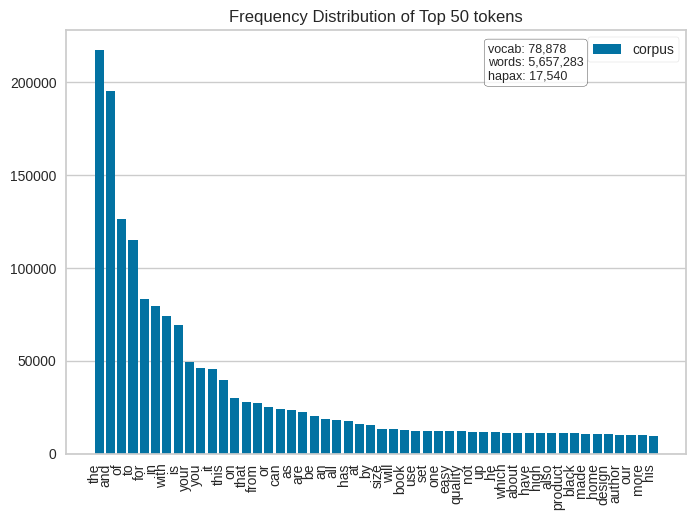

<Axes: title={'center': 'Frequency Distribution of Top 50 tokens'}>

In [5]:
%matplotlib inline
vectorizer = CountVectorizer()
docs       = vectorizer.fit_transform(df[1])
features   = vectorizer.get_feature_names_out()
visualizer = FreqDistVisualizer(features=features, orient='v')
visualizer.fit(docs)
visualizer.show()

In [6]:
text = df[1]
labels = df[0]

print(text.shape, labels.shape)

(50424,) (50424,)


In [7]:
text = text[(labels == "Books") | (labels == "Electronics")]
labels = labels[(labels == "Books") | (labels == "Electronics")]

print(text.shape, labels.shape)

(22441,) (22441,)


In [8]:
indices = []
for x in text:
    if (len(x.split(' ')) < 64):
        indices.append(True)
    else:
        indices.append(False)

text = text[indices]
labels = labels[indices]

In [9]:
# remove digits, @-mentions, links, stopwords
text = text.str.lower()
text = text.apply(lambda elem: re.sub(r"(https?:\/\/(?:www\.|(?!www))[a-zA-Z0-9][a-zA-Z0-9-]+[a-zA-Z0-9]\.[^\s]{2,}|www\.[a-zA-Z0-9][a-zA-Z0-9-]+[a-zA-Z0-9]\.[^\s]{2,}|https?:\/\/(?:www\.|(?!www))[a-zA-Z0-9]+\.[^\s]{2,}|www\.[a-zA-Z0-9]+\.[^\s]{2,})", "", elem))
text = text.apply(lambda x : nltk.word_tokenize(x))
text = text.apply(lambda x : " ".join([word for word in x if word not in nltk.corpus.stopwords.words()]))

text.shape

(8735,)

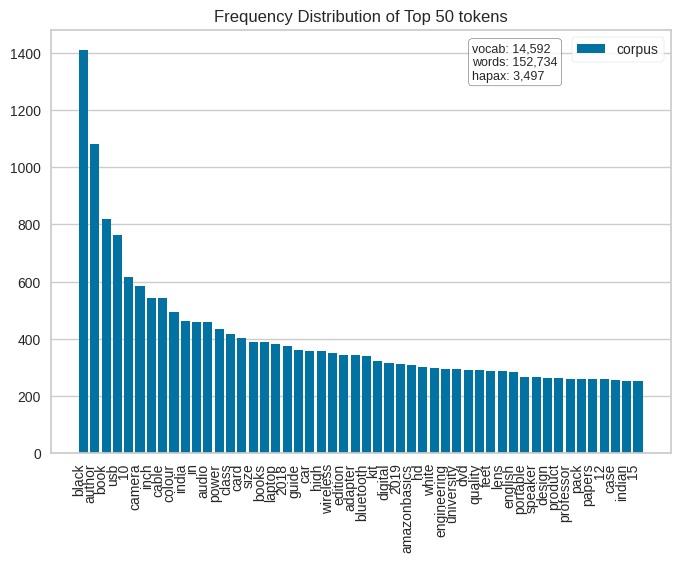

<Axes: title={'center': 'Frequency Distribution of Top 50 tokens'}>

In [10]:
%matplotlib inline
vectorizer = CountVectorizer()
docs       = vectorizer.fit_transform(text)
features   = vectorizer.get_feature_names_out()
visualizer = FreqDistVisualizer(features=features, orient='v')
visualizer.fit(docs)
visualizer.show()

In [11]:
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")
model = BertModel.from_pretrained("bert-base-uncased")

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [12]:
labels = np.array(labels)
text = np.array(text)

In [13]:
lengths = []

X = text
for i in range(len(text)):
  X[i] = tokenizer.tokenize(X[i])
  X[i] = tokenizer.convert_tokens_to_ids(X[i])

for i in range(len(X)):
  lengths.append(len(X[i]))

In [14]:
lengths = np.array(lengths)
X = np.array(X)

print(lengths)
print(lengths.shape)
print(np.sum(lengths < 64) / len(lengths))
print(np.sum(lengths < 64))
print(np.sum((lengths < 64) & (labels == "Electronics")))
print(np.sum((lengths < 64) & (labels == "Books")))

[ 6 21 68 ... 35 18 10]
(8735,)
0.894791070406411
7816
2701
5115


In [15]:
X_electronics = X[(lengths < 64) & (labels == "Electronics")]
X_books = X[(lengths < 64) & (labels == "Books")]
X_new = X_electronics[:2000].tolist() + X_books[:2000].tolist()

y_electronics = labels[(lengths < 64) & (labels == "Electronics")]
y_books = labels[(lengths < 64) & (labels == "Books")]
y_new = y_electronics[:2000].tolist() + y_books[:2000].tolist()

In [16]:
X_train, X_test, y_train, y_test = train_test_split(np.array(X_new), np.array(y_new), train_size=500, shuffle=True)

X_test = X_test[:100]
y_test = y_test[:100]

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


In [17]:
model.config.max_position_embeddings = 64
max_length = model.config.max_position_embeddings

X_train_padded = []
X_test_padded = []

for i in range(len(X_train)):
  X_train_padded.append(X_train[i] + [0] * (max_length - len(X_train[i])))
for i in range(len(X_test)):
  X_test_padded.append(X_test[i] + [0] * (max_length - len(X_test[i])))

X_train_padded = torch.from_numpy(np.array(X_train_padded))
X_test_padded = torch.from_numpy(np.array(X_test_padded))

In [18]:
bert_train_output = model(X_train_padded)
print(bert_train_output)

BaseModelOutputWithPoolingAndCrossAttentions(last_hidden_state=tensor([[[ 0.3393, -0.0941,  0.4751,  ..., -0.2892,  0.1719, -0.1414],
         [ 0.5299,  0.2970,  0.8823,  ..., -0.1821,  0.0521, -0.0464],
         [ 0.6337,  0.3779,  0.5835,  ..., -0.0337, -0.0341, -0.7207],
         ...,
         [ 0.6239, -0.0859,  1.1006,  ..., -0.2849,  0.6503, -0.5650],
         [ 0.6258, -0.1387,  1.1265,  ..., -0.2751,  0.7082, -0.5934],
         [ 0.6511, -0.1944,  1.0596,  ..., -0.2924,  0.7143, -0.5455]],

        [[-0.2328, -0.3101,  0.5034,  ..., -0.0422,  0.2794, -0.0951],
         [-0.5943, -0.0383,  0.0685,  ..., -0.3432,  0.4052,  0.1134],
         [-0.2472, -0.2584,  0.5923,  ..., -0.1669,  0.2578,  0.4608],
         ...,
         [ 0.3204, -0.1430,  1.3446,  ..., -0.7719,  0.0693, -0.4769],
         [ 0.3066, -0.1990,  1.2313,  ..., -0.7878,  0.0651, -0.6186],
         [ 0.2589, -0.1719,  1.0693,  ..., -0.8271, -0.0044, -0.7275]],

        [[-0.0897, -0.2183,  0.0674,  ..., -0.4964,  

In [19]:
bert_train_output = bert_train_output[1].detach().numpy().copy()
bert_train_output = bert_train_output.reshape(X_train.shape[0], 768)

In [20]:
bert_test_output = model(X_test_padded)
print(bert_test_output)

BaseModelOutputWithPoolingAndCrossAttentions(last_hidden_state=tensor([[[-0.2491,  0.4160,  0.2253,  ..., -0.5132,  0.2613, -0.0046],
         [-0.5847,  0.3304,  0.3107,  ..., -0.4153,  0.4833,  0.3353],
         [-0.4634,  0.1888,  0.1774,  ..., -0.3545,  0.0354,  0.0796],
         ...,
         [ 0.2544,  0.2645,  1.4163,  ..., -0.7708,  0.1412,  0.3341],
         [ 0.2632,  0.2704,  1.4231,  ..., -0.7201,  0.1389,  0.3146],
         [ 0.2732,  0.2939,  1.3921,  ..., -0.7181,  0.1054,  0.2379]],

        [[-0.0480, -0.0641,  0.4096,  ..., -0.5427,  0.7817,  0.3162],
         [-0.2014,  0.1841,  0.3161,  ..., -0.3297,  0.7067,  0.5944],
         [ 0.0260,  0.3163,  0.1252,  ..., -0.5125,  0.3577,  0.3870],
         ...,
         [-0.1788, -0.0494,  0.7347,  ..., -0.6767,  0.8196,  0.0865],
         [-0.1749, -0.0862,  0.7177,  ..., -0.6676,  0.8745,  0.0825],
         [-0.1668, -0.0839,  0.6630,  ..., -0.6773,  0.9256,  0.0580]],

        [[-0.0227, -0.2240, -0.3219,  ..., -0.5088,  

In [21]:
bert_test_output = bert_test_output[1].detach().numpy().copy()
bert_test_output = bert_test_output.reshape(X_test.shape[0], 768)

In [22]:
le = LabelEncoder()
le.fit(y_train)

LabelEncoder()

In [23]:
clf = neural_network.MLPClassifier()
clf.fit(bert_train_output, le.transform(y_train))

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.


MLPClassifier()

In [24]:
print("Train accuracy:", np.mean(clf.predict(bert_train_output) == le.transform(y_train)))
print("Test accuracy:", np.mean(clf.predict(bert_test_output) == le.transform(y_test)))

Train accuracy: 0.972
Test accuracy: 0.9


In [25]:
print(np.unique(y_test))

['Books' 'Electronics']


In [26]:
np.mean(y_test=="Electronics")

0.38

In [27]:
dill.dump_session("pre_shap.pkl")
#dill.load_session("pre_shap.pkl")

## Shap

In [28]:
shap.initjs()

In [29]:
to_explain = np.array(X_test_padded)
to_explain.shape

(100, 64)

In [30]:
def prediction_model(X):
  bert_output = model(torch.from_numpy(np.array(X)).to(torch.int64))
  sequence_output = bert_output[1].detach().numpy()
  return clf.predict(sequence_output.reshape(X.shape[0], 768))

In [31]:
permutation_values = []
for i in range(int(len(to_explain)/20)):
    permutation_explainer = shap.explainers.Permutation(prediction_model, np.array(to_explain[20*i:20*(i+1)]))
    for j in range(20*i, 20*(i+1)):
        permutation_values.append(permutation_explainer(np.array([to_explain[j]])))
        print(i,j)
        dill.dump_session("post_shap.pkl")

Permutation explainer: 2it [02:03, 123.89s/it]                                  


0 0


Permutation explainer: 2it [02:57, 177.77s/it]                                  


0 1


Permutation explainer: 2it [02:05, 125.54s/it]                                  


0 2


Permutation explainer: 2it [03:14, 194.54s/it]                                  


0 3


Permutation explainer: 2it [01:41, 101.25s/it]                                  


0 4


Permutation explainer: 2it [02:13, 133.26s/it]                                  


0 5


Permutation explainer: 2it [02:46, 166.02s/it]                                  


0 6


Permutation explainer: 2it [01:51, 111.26s/it]                                  


0 7


Permutation explainer: 2it [01:36, 96.83s/it]                                   


0 8


Permutation explainer: 2it [01:37, 97.88s/it]                                   


0 9


Permutation explainer: 2it [02:49, 169.19s/it]                                  


0 10


Permutation explainer: 2it [02:04, 124.65s/it]                                  


0 11


Permutation explainer: 2it [01:55, 115.17s/it]                                  


0 12


Permutation explainer: 2it [02:32, 152.87s/it]                                  


0 13


Permutation explainer: 2it [01:44, 105.00s/it]                                  


0 14


Permutation explainer: 2it [02:41, 161.63s/it]                                  


0 15


Permutation explainer: 2it [01:43, 103.23s/it]                                  


0 16


Permutation explainer: 2it [02:00, 120.64s/it]                                  


0 17


Permutation explainer: 2it [01:40, 100.11s/it]                                  


0 18


Permutation explainer: 2it [01:37, 97.12s/it]                                   


0 19


Permutation explainer: 2it [03:26, 206.28s/it]                                  


1 20


Permutation explainer: 2it [02:37, 157.81s/it]                                  


1 21


Permutation explainer: 2it [01:56, 116.36s/it]                                  


1 22


Permutation explainer: 2it [01:57, 117.45s/it]                                  


1 23


Permutation explainer: 2it [02:08, 128.56s/it]                                  


1 24


Permutation explainer: 2it [02:01, 121.52s/it]                                  


1 25


Permutation explainer: 2it [02:09, 129.35s/it]                                  


1 26


Permutation explainer: 2it [03:55, 235.83s/it]                                  


1 27


Permutation explainer: 2it [03:50, 230.05s/it]                                  


1 28


Permutation explainer: 2it [02:11, 131.20s/it]                                  


1 29


Permutation explainer: 2it [02:58, 178.50s/it]                                  


1 30


Permutation explainer: 2it [02:46, 166.24s/it]                                  


1 31


Permutation explainer: 2it [02:09, 129.49s/it]                                  


1 32


Permutation explainer: 2it [02:00, 120.45s/it]                                  


1 33


Permutation explainer: 2it [03:29, 209.25s/it]                                  


1 34


Permutation explainer: 2it [02:56, 176.31s/it]                                  


1 35


Permutation explainer: 2it [01:57, 117.73s/it]                                  


1 36


Permutation explainer: 2it [01:57, 117.60s/it]                                  


1 37


Permutation explainer: 2it [02:12, 132.37s/it]                                  


1 38


Permutation explainer: 2it [03:19, 199.76s/it]                                  


1 39


Permutation explainer: 2it [01:20, 80.73s/it]                                   


2 40


Permutation explainer: 2it [01:29, 89.96s/it]                                   


2 41


Permutation explainer: 2it [01:30, 90.18s/it]                                   


2 42


Permutation explainer: 2it [01:25, 85.20s/it]                                   


2 43


Permutation explainer: 2it [02:43, 163.51s/it]                                  


2 44


Permutation explainer: 2it [01:33, 93.23s/it]                                   


2 45


Permutation explainer: 2it [02:12, 132.99s/it]                                  


2 46


Permutation explainer: 2it [01:26, 86.14s/it]                                   


2 47


Permutation explainer: 2it [01:24, 84.16s/it]                                   


2 48


Permutation explainer: 2it [01:23, 83.25s/it]                                   


2 49


Permutation explainer: 2it [02:56, 176.07s/it]                                  


2 50


Permutation explainer: 2it [02:16, 136.07s/it]                                  


2 51


Permutation explainer: 2it [02:22, 142.74s/it]                                  


2 52


Permutation explainer: 2it [01:19, 79.84s/it]                                   


2 53


Permutation explainer: 2it [01:18, 78.75s/it]                                   


2 54


Permutation explainer: 2it [02:09, 129.33s/it]                                  


2 55


Permutation explainer: 2it [01:55, 115.19s/it]                                  


2 56


Permutation explainer: 2it [01:21, 81.83s/it]                                   


2 57


Permutation explainer: 2it [01:23, 83.91s/it]                                   


2 58


Permutation explainer: 2it [03:03, 183.16s/it]                                  


2 59


Permutation explainer: 2it [01:52, 112.19s/it]                                  


3 60


Permutation explainer: 2it [01:52, 112.17s/it]                                  


3 61


Permutation explainer: 2it [01:55, 115.34s/it]                                  


3 62


Permutation explainer: 2it [03:36, 216.37s/it]                                  


3 63


Permutation explainer: 2it [03:21, 201.73s/it]                                  


3 64


Permutation explainer: 2it [02:42, 162.33s/it]                                  


3 65


Permutation explainer: 2it [01:42, 102.80s/it]                                  


3 66


Permutation explainer: 2it [02:17, 137.60s/it]                                  


3 67


Permutation explainer: 2it [01:42, 102.97s/it]                                  


3 68


Permutation explainer: 2it [02:42, 162.87s/it]                                  


3 69


Permutation explainer: 2it [01:42, 102.57s/it]                                  


3 70


Permutation explainer: 2it [01:51, 111.64s/it]                                  


3 71


Permutation explainer: 2it [01:41, 101.21s/it]                                  


3 72


Permutation explainer: 2it [03:29, 209.84s/it]                                  


3 73


Permutation explainer: 2it [01:51, 111.59s/it]                                  


3 74


Permutation explainer: 2it [01:39, 99.96s/it]                                   


3 75


Permutation explainer: 2it [02:23, 143.01s/it]                                  


3 76


Permutation explainer: 2it [03:52, 232.57s/it]                                  


3 77


Permutation explainer: 2it [01:47, 107.68s/it]                                  


3 78


Permutation explainer: 2it [01:41, 101.52s/it]                                  


3 79


Permutation explainer: 2it [01:45, 105.06s/it]                                  


4 80


Permutation explainer: 2it [02:39, 159.11s/it]                                  


4 81


Permutation explainer: 2it [02:39, 159.82s/it]                                  


4 82


Permutation explainer: 2it [02:30, 150.61s/it]                                  


4 83


Permutation explainer: 2it [01:45, 105.23s/it]                                  


4 84


Permutation explainer: 2it [01:43, 103.58s/it]                                  


4 85


Permutation explainer: 2it [01:44, 104.13s/it]                                  


4 86


Permutation explainer: 2it [03:15, 195.42s/it]                                  


4 87


Permutation explainer: 2it [02:05, 125.61s/it]                                  


4 88


Permutation explainer: 2it [01:47, 107.46s/it]                                  


4 89


Permutation explainer: 2it [01:42, 102.88s/it]                                  


4 90


Permutation explainer: 2it [03:30, 210.44s/it]                                  


4 91


Permutation explainer: 2it [01:46, 106.39s/it]                                  


4 92


Permutation explainer: 2it [01:57, 117.54s/it]                                  


4 93


Permutation explainer: 2it [03:09, 189.01s/it]                                  


4 94


Permutation explainer: 2it [01:43, 103.63s/it]                                  


4 95


Permutation explainer: 2it [01:48, 108.48s/it]                                  


4 96


Permutation explainer: 2it [03:31, 211.92s/it]                                  


4 97


Permutation explainer: 2it [02:49, 169.85s/it]                                  


4 98


Permutation explainer: 2it [02:34, 154.55s/it]                                  


4 99


In [32]:
permutation_values

[.values =
 array([[-1.18750000e-01, -1.25000000e-02, -6.25000000e-03,
          1.87500000e-02,  1.25000000e-02, -2.50000000e-02,
         -3.12500000e-02, -1.87500000e-02, -5.00000000e-02,
         -3.12500000e-02,  3.75000000e-02, -1.87500000e-02,
          0.00000000e+00, -1.87500000e-02, -6.25000000e-03,
         -6.25000000e-03, -6.25000000e-03, -4.37500000e-02,
         -1.25000000e-02,  1.25000000e-02, -1.25000000e-02,
          5.20417043e-18,  3.46944695e-18, -3.12500000e-02,
         -6.25000000e-03, -1.25000000e-02, -6.25000000e-03,
         -1.25000000e-02, -1.25000000e-02,  0.00000000e+00,
          1.25000000e-02,  6.25000000e-03,  0.00000000e+00,
         -6.25000000e-03,  0.00000000e+00, -1.87500000e-02,
         -6.25000000e-03, -6.25000000e-03, -6.25000000e-03,
         -1.25000000e-02,  1.25000000e-02,  0.00000000e+00,
         -6.25000000e-03,  6.25000000e-03,  0.00000000e+00,
          0.00000000e+00, -6.25000000e-03, -6.25000000e-03,
          0.00000000e+00,  6.

In [33]:
perm_vals = {"values": [], "base_values": [], "data": []}
for pv in permutation_values:
    perm_vals["values"].append(pv.values[0])
    perm_vals["base_values"].append(pv.base_values[0])
    perm_vals["data"].append(pv.data[0])

Sentence: o ##ce ##j ##wc ##d study companion : o ##ce java ee web component developer ( certification study guide ) ; Prediction: [0] ; True value: Books


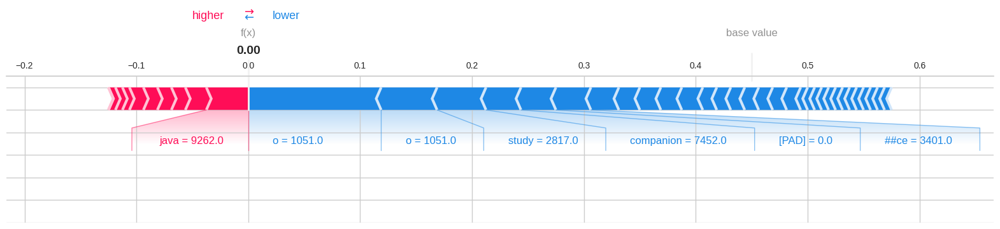

Sentence: harry potter : artifact vault author jody rev ##ens ##on author harry potter : creature vault , harry potter : magical places films harry potter : character vault edited contributed york times sellers harry potter : film wizard ##ry harry potter : page screen . ; Prediction: [0] ; True value: Books


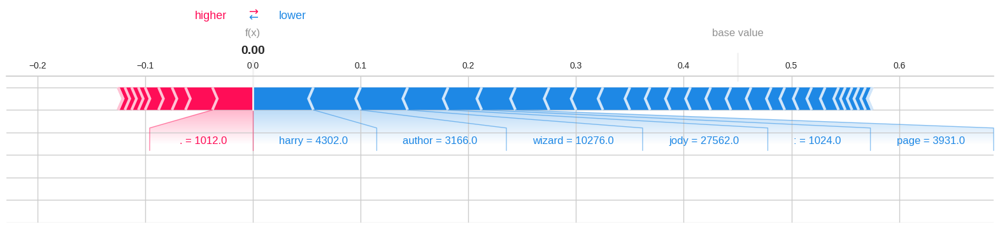

Sentence: holy ##hi ##gh mu ##zi ##li wireless blue ##tooth speaker 3 . 5 mm t ##f card slot usb port car mobile phone laptop computer tv pen drive ; Prediction: [1] ; True value: Electronics


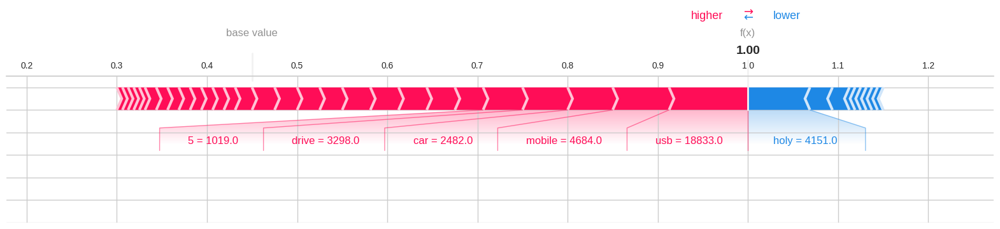

Sentence: 24 inch ( 60 . 96 cm ) ultra thin be ##zel led monitor - wu ##x ##ga , ip ##s panel , hd ##mi , display , usb , audio ports - u2 ##41 ##5 ( black / silver ) 24 ' ' 1920 x 1200 ip ##s led ; Prediction: [1] ; True value: Electronics


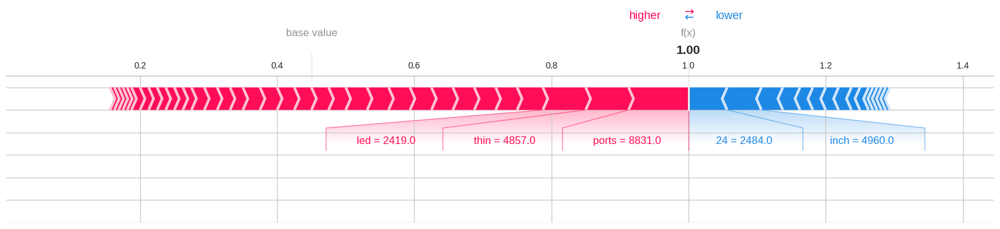

Sentence: india unlimited book 4 : sports quiz book ; Prediction: [0] ; True value: Books


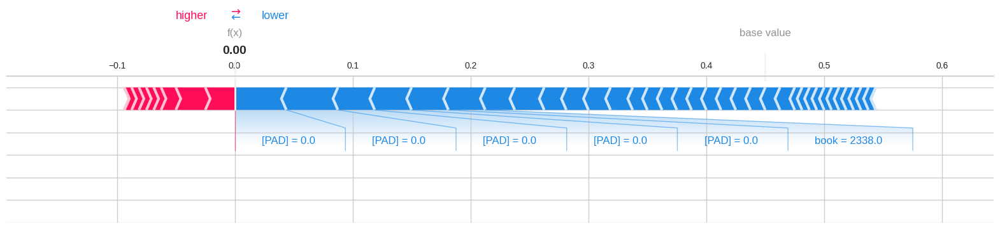

Sentence: ik ##all 5 . 1 channel blue ##tooth multimedia home theatre system ka ##ll k ##12 basic mobile ( dark blue ) breath felt powerful speaker acquire speaker mobile phone . ; Prediction: [1] ; True value: Electronics


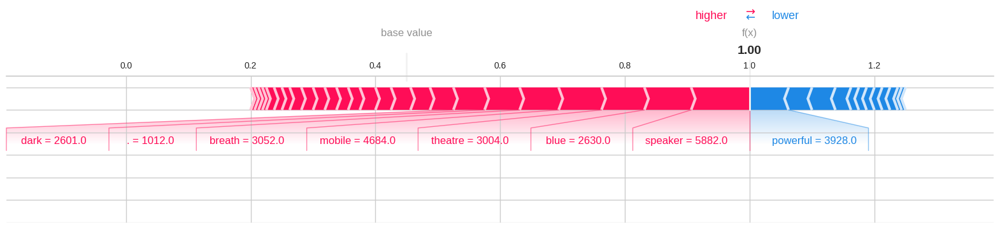

Sentence: society leaf tea premium packet , 1000 ##g crushed , twisted curled tea leaf carefully picked create amalgamation exquisite aroma taste . ct ##c process ensures society tea offers perfect in ##fusion rich color strong flavor providing customer cup ##pa cher ##ish . ; Prediction: [0] ; True value: Books


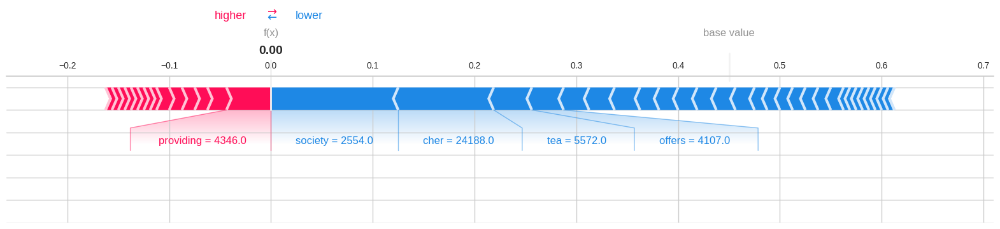

Sentence: st ##ori ##te 9 pin serial male female extension cable lead db ##9 rs ##23 ##2 serial , gray ; Prediction: [1] ; True value: Electronics


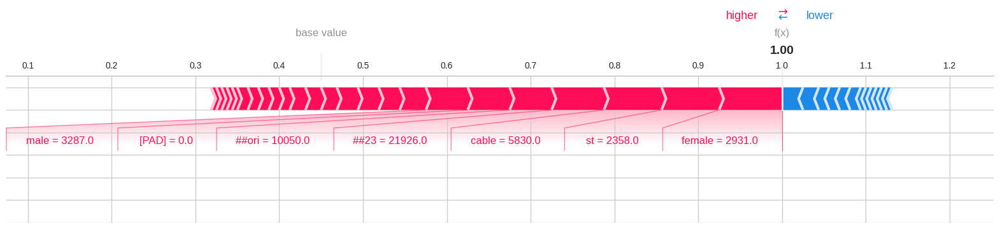

Sentence: 281 ; Prediction: [0] ; True value: Books


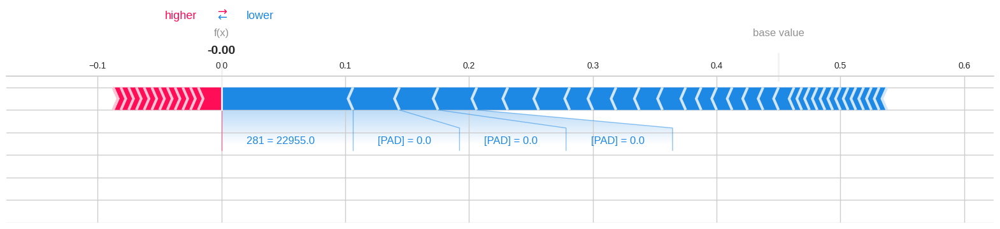

Sentence: political theory ; Prediction: [0] ; True value: Books


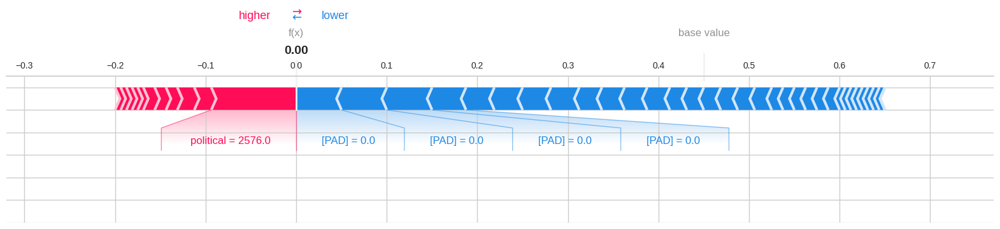

Sentence: fuji ##film ins ##ta ##x mini instant film ( 20 sheets ) style : twin pack - 20 sheets offers stunning instant pictures fit purse , wallet mini photo frame . film ensures sharp , clear reproduction , vivid color natural skin tones . ; Prediction: [1] ; True value: Books


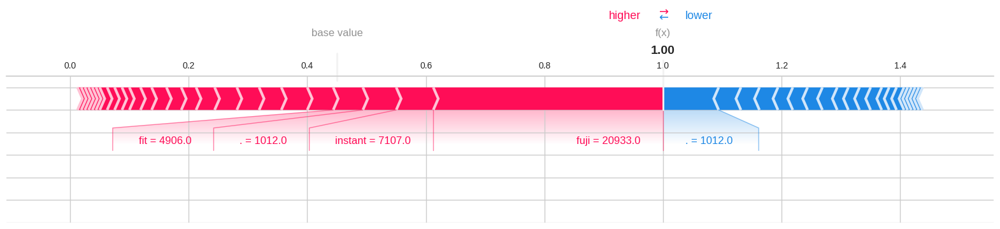

Sentence: amazon ##bas ##ics 10 feet display ##port display ##port cable size name : 10 feet amazon ##bas ##ics display ##port display ##port cable - 10 feet ; Prediction: [1] ; True value: Electronics


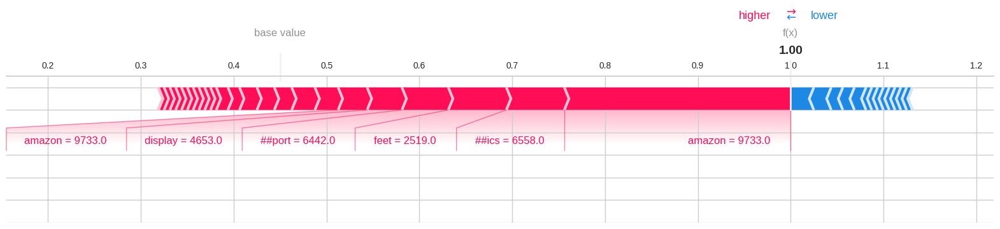

Sentence: ign ##ou english solved assignments - meg ##1 , meg ##2 , meg ##3 , meg ##4 ( 2018 - 2019 ) ; Prediction: [0] ; True value: Books


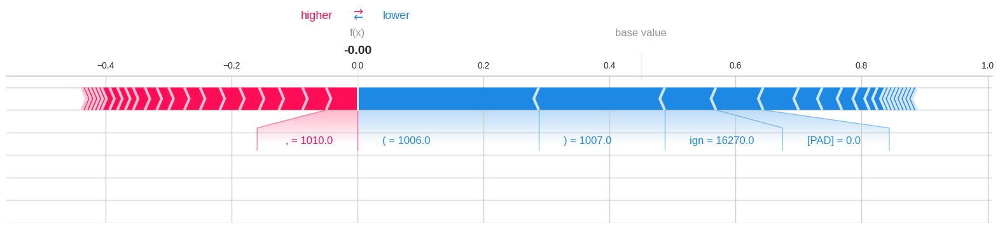

Sentence: sand ##isk ultra fit usb 3 . 1 flash drive 32 ##gb size name : 32 ##gb sand ##isk ultra fit usb 3 . 1 32 ##gb - small form factor plug stay hi - speed usb drive . ; Prediction: [1] ; True value: Electronics


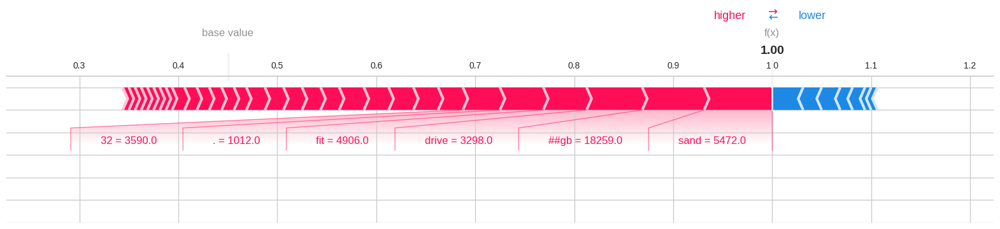

Sentence: amazon ##bas ##ics cl ##2 - rated coa ##xia ##l cable - 8 feet ; Prediction: [1] ; True value: Electronics


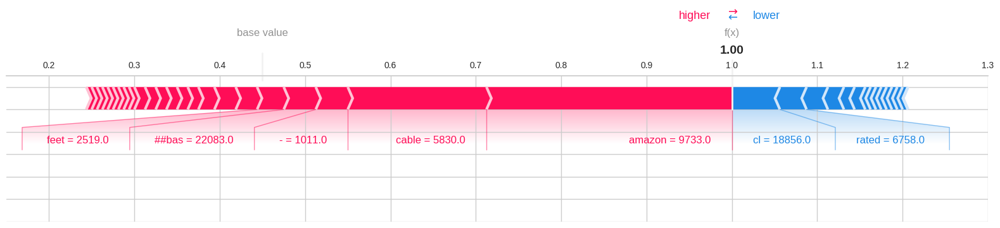

Sentence: front ##ech 4 . 7 gb 500 ##1 f ##d blank dvd - r - 50 pcs dvd offers wide compatibility , stable writing temperature adapt ##ability . optical media 4 . 7 gb 120 50 p ##kt ( ft ) . ; Prediction: [1] ; True value: Electronics


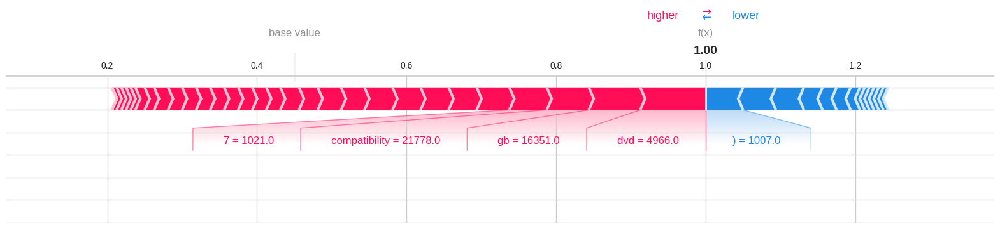

Sentence: [UNK] [UNK] specially recommended bin - sac ##hi ##val ##ay exams ; Prediction: [0] ; True value: Books


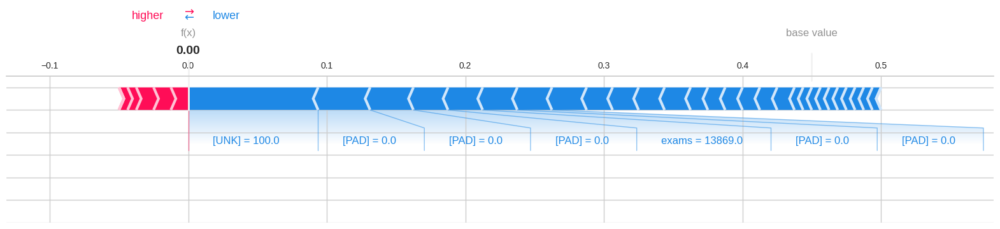

Sentence: l ##sat prep book : study guide & practice test questions law school admission council ' s ( l ##sa ##c ) law school admission test ; Prediction: [0] ; True value: Books


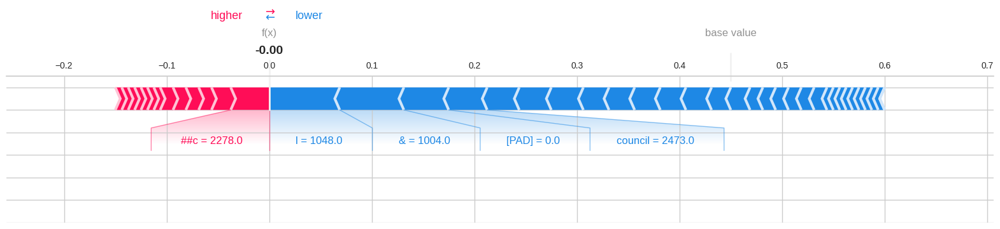

Sentence: general knowledge - science ; Prediction: [0] ; True value: Books


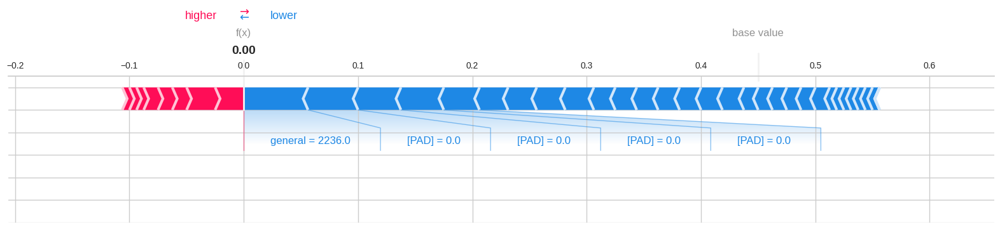

Sentence: universe ; Prediction: [0] ; True value: Books


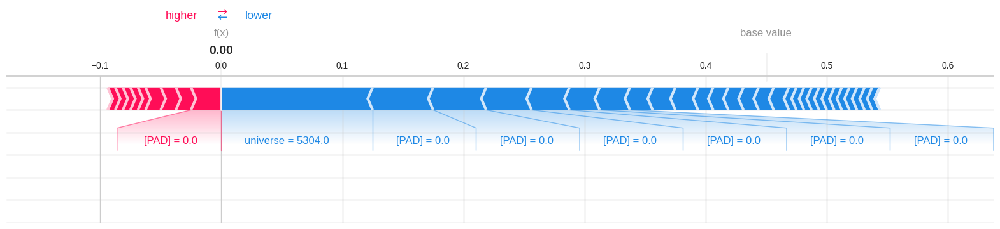

Sentence: assembled desktop computer intel core 2 duo 2 ##gb / 250 gb hd ##d intel core 2 duo 1 . 8 ghz processor h ##yn ##ix 2 gb ram intel g 31 mother board punta ze ##bron ##ics cabinet w ##d sea ##gate 250 gb hard drive optical drive dvd drive including ; Prediction: [1] ; True value: Electronics


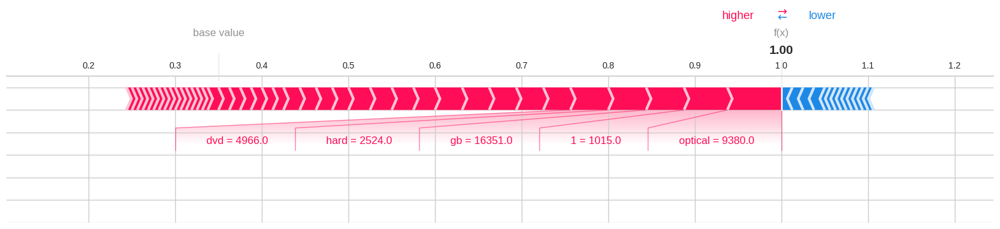

Sentence: crest sy - pc ##i ##400 ##10 pc ##i raid host controller card brings life desktop pc . connects 4 sat ##a high speed sat ##a hard disk drives . supports windows 8 server 2012 ; Prediction: [1] ; True value: Electronics


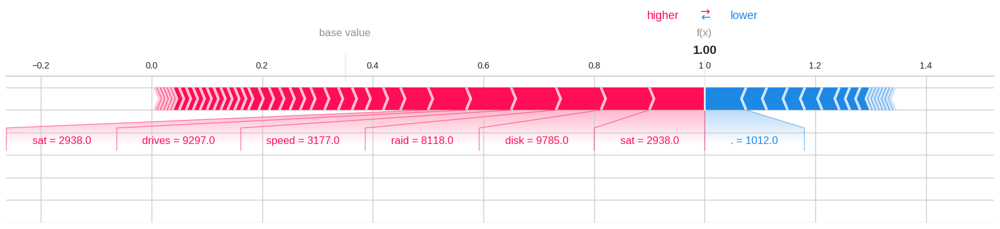

Sentence: 2500 km ##s lost road ; Prediction: [0] ; True value: Books


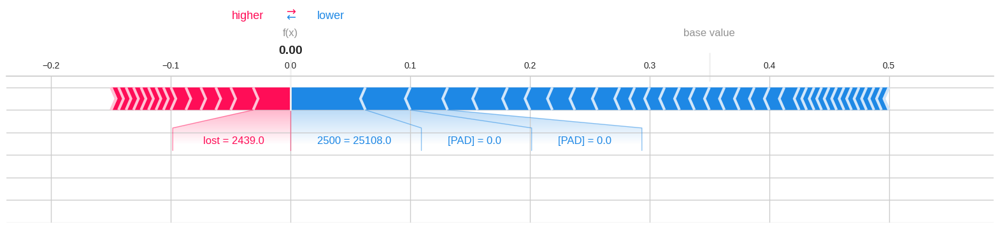

Sentence: software engineering ; Prediction: [0] ; True value: Books


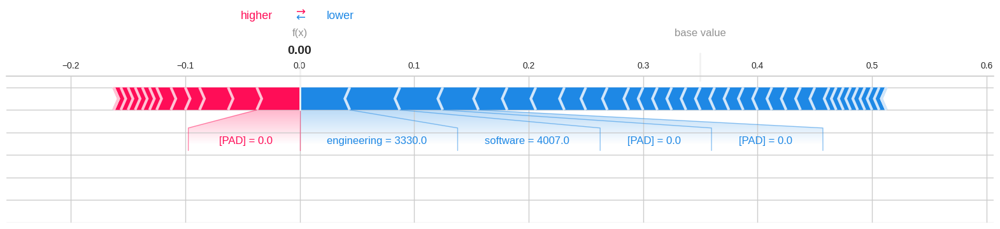

Sentence: modern linguistics : introduction author : s . k . ve ##rma , n . krishna ##sw ##amy ; Prediction: [0] ; True value: Books


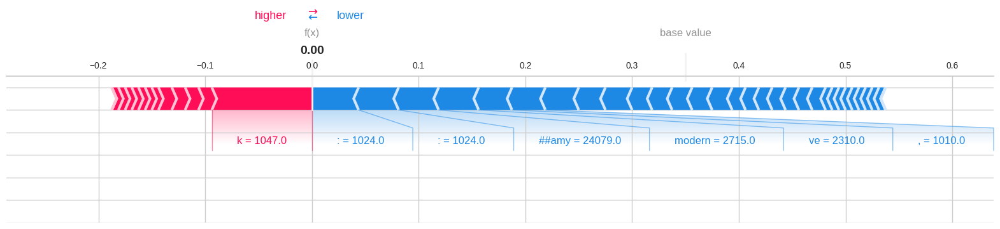

Sentence: nov ##ex faux leather 15 - inch laptop bag ( brown ) ; Prediction: [0] ; True value: Electronics


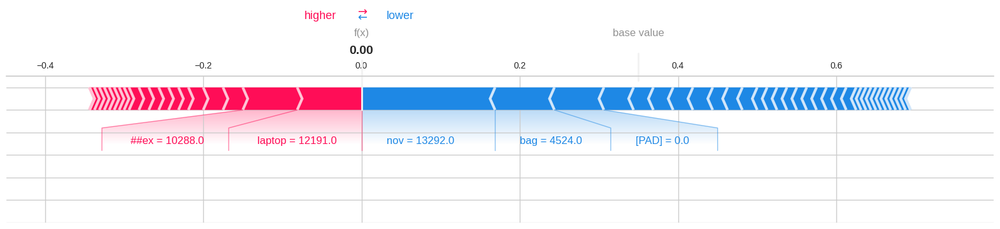

Sentence: ii ##t - jam : m . sc . ( chemistry ) previous papers & practice test papers ( solved ) ; Prediction: [0] ; True value: Books


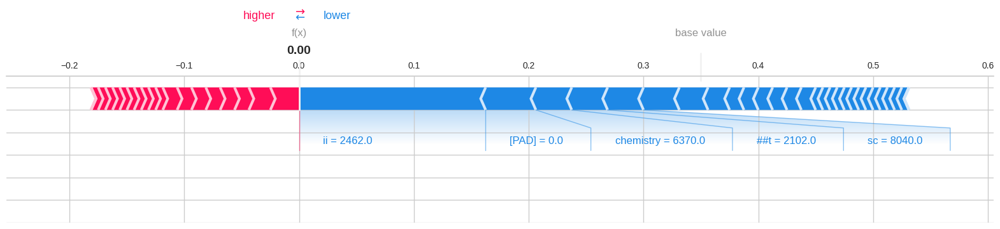

Sentence: 19 . 5 inch ( 49 . 41 cm ) led monitor - hd , tn panel v ##ga port - e ##20 ##16 ##h ##v ( black ) note : inca ##se issue , kindly contact brand 1800 - 425 - 402 ##6 – fr ##i ( 9 – 6 ##pm ) sat ( 9 - 6 ##pm ) . ; Prediction: [1] ; True value: Electronics


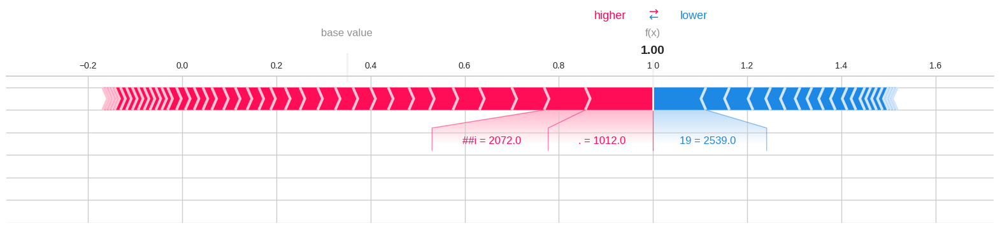

Sentence: precision design 6 - piece camera & lens cleaning kit blow ##er , brush , fluid , cloth , tissues & tips + 6 micro ##fi ##ber cleaning cloth ##s precision design 6 - piece camera & lens cleaning kit blow ##er , brush , fluid , cloth , tissues & tips + 6 micro ##fi ##ber cleaning cloth ##s ; Prediction: [0] ; True value: Electronics


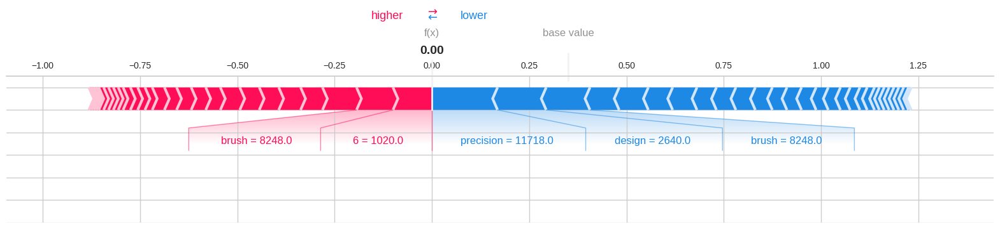

Sentence: cables ##et ##c pro series 324 ##4 1 . 8 meter digital optical to ##slin ##k audio cable ( black ) ; Prediction: [1] ; True value: Electronics


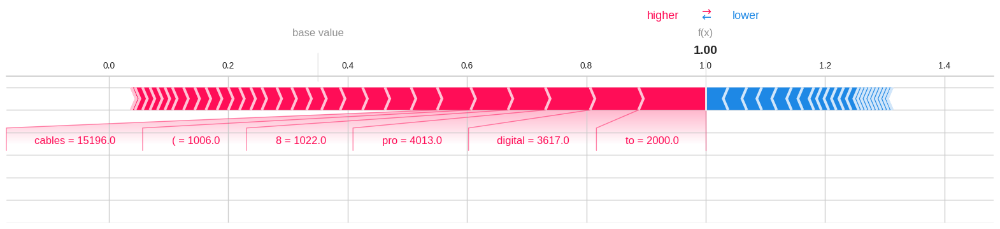

Sentence: competitive handbook nursing - vol 1 useful ##l nursing competitive examination ai ##im ##s , pg ##i , sg ##pg ##i , rr ##b , gm ##ch , es ##ic , r ##ps ##c , ru ##hs , mn ##c , nursing enter ##ence ; Prediction: [0] ; True value: Books


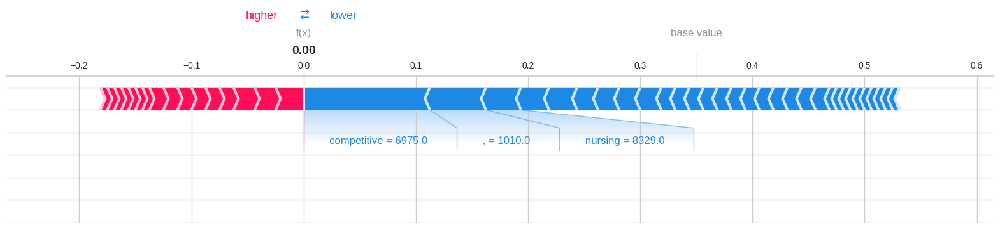

Sentence: microscopic ha ##ema ##tology : practical guide laboratory author gillian ro ##zen ##berg fai ##ms , ff ##sc ( rc ##pa ) senior medical scientist ##de ##par ##tment ha ##ema ##tology ##sea ##ls rand ##wick , prince wales hospital ; Prediction: [0] ; True value: Books


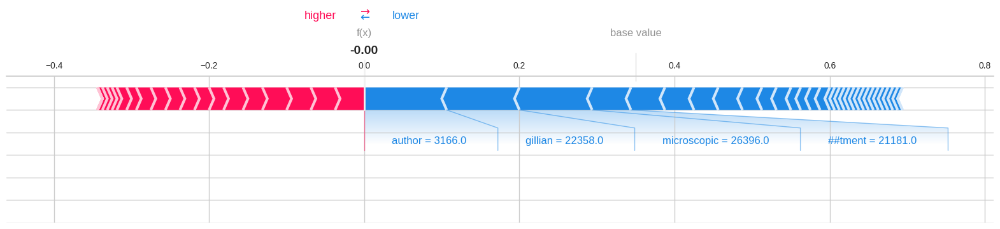

Sentence: amazon ##bas ##ics 4 - feet digital audio coa ##xia ##l cable size name : 4 feet amazon brand . ; Prediction: [1] ; True value: Electronics


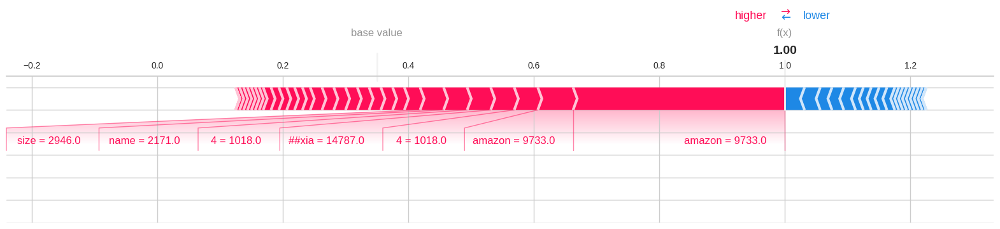

Sentence: rr ##b study guide 2019 stage 1 ( hindi ) ; Prediction: [0] ; True value: Books


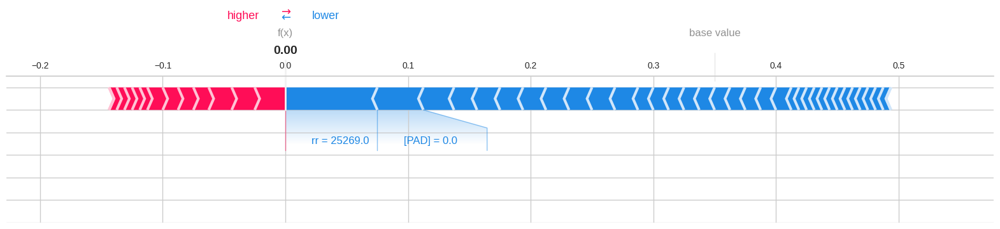

Sentence: ce ##wa ##al han ##bai ##li basket fabric babies todd ##lers children photography blanket pictures photo studio prop descriptions : color : pink , black , grey , coffee , beige , purple ##mate ##rial : flee ##ce ##pro ##du ##ct size : 50 ##x ##60 ##cm ##pack ##age includes : 1 x photography blanket ; Prediction: [0] ; True value: Electronics


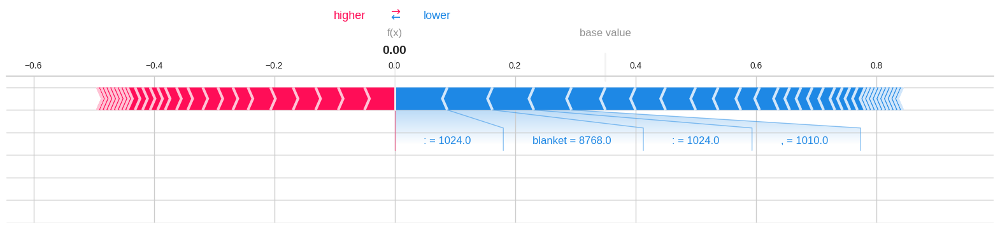

Sentence: l ##g g ##h ##24 ##ns ##d ##1 internal sat ##a dvd writer m - disc patent rock - like recording surface instead organic dye etc ##h data disc . m - disc tested proven out ##las ##t standard dvds currently market . ; Prediction: [1] ; True value: Electronics


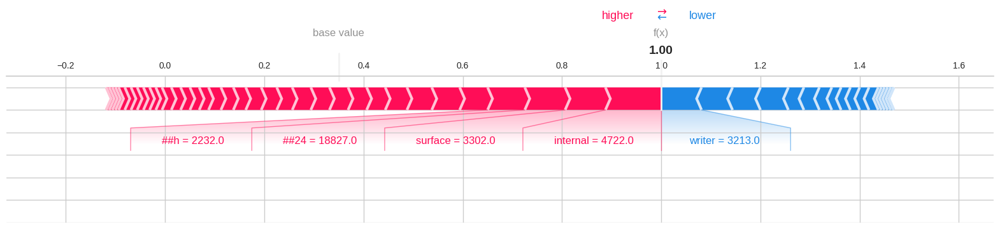

Sentence: operating system concepts 9th edition ; Prediction: [0] ; True value: Books


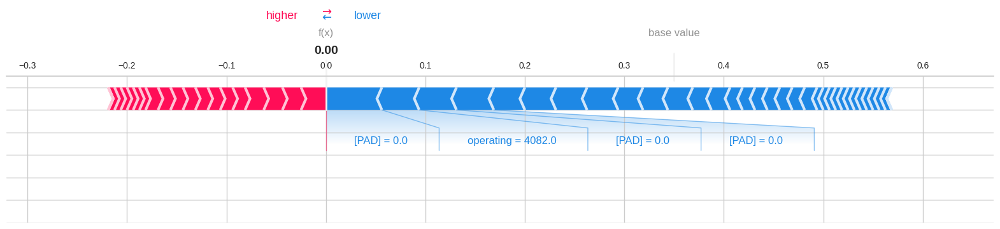

Sentence: family animals ; Prediction: [0] ; True value: Books


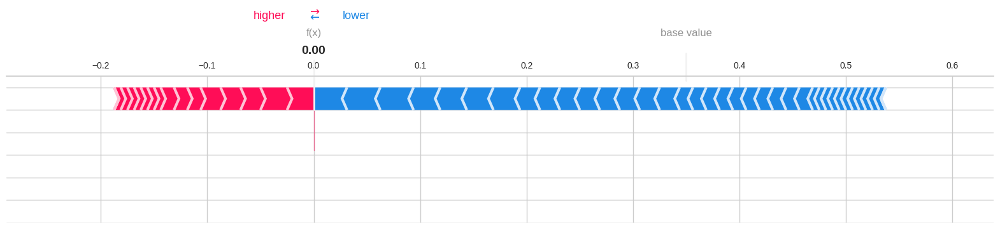

Sentence: tamil ##nad ##u history books ( class xi & xii ) set 2 books ( photo ##co ##py ) ; Prediction: [1] ; True value: Books


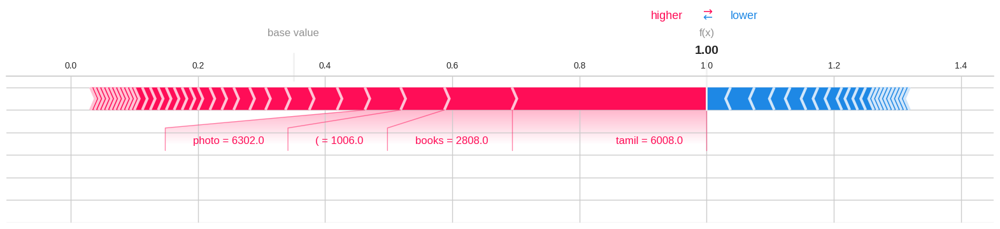

Sentence: society tea premium green tea , 250 ##g dubbed ' nature ' s solution ' , green tea packed hilt fl ##av ##ono ##ids , anti ##ox ##ida ##nts helpful properties . couple cups daily basis fight ai ##lm ##ents pink health . society premium green tea represents quality value space . ; Prediction: [0] ; True value: Books


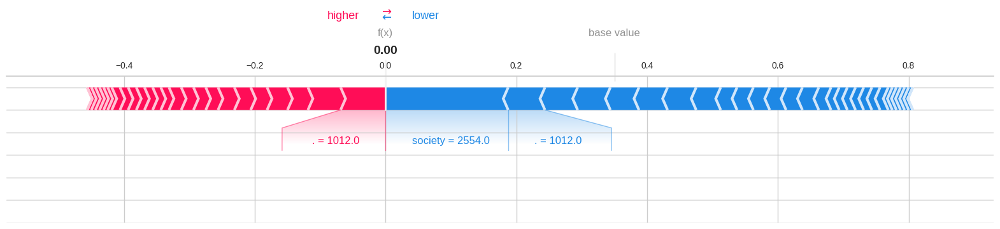

Sentence: grow rich book napoleon hill . ; Prediction: [0] ; True value: Books


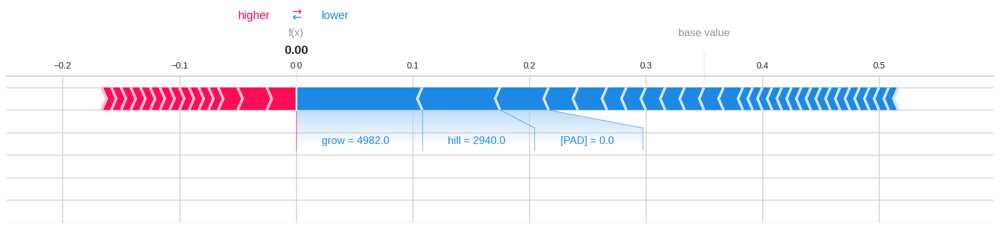

Sentence: ac ##uta ##s ##® tempered glass screen guard protector canon e ##os 200 ##d digital sl ##r camera ; Prediction: [1] ; True value: Electronics


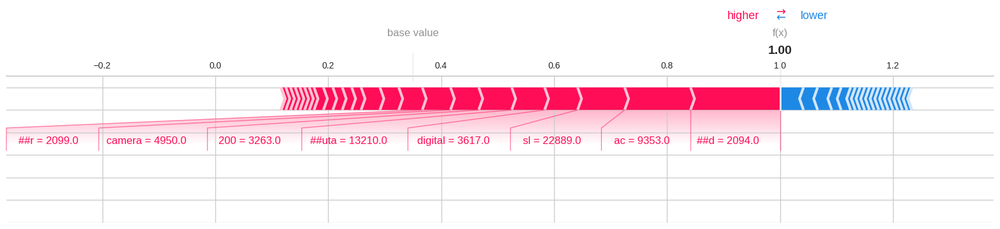

Sentence: quantum ##zer ##o external powered usb 3 . 0 hub ( 10 ports 60 ##w ) ; Prediction: [1] ; True value: Electronics


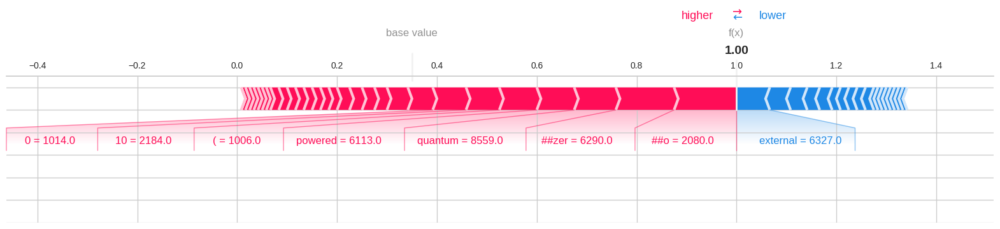

Sentence: comprehensive guide ib ##ps bank po / mt preliminary & exam ; Prediction: [0] ; True value: Books


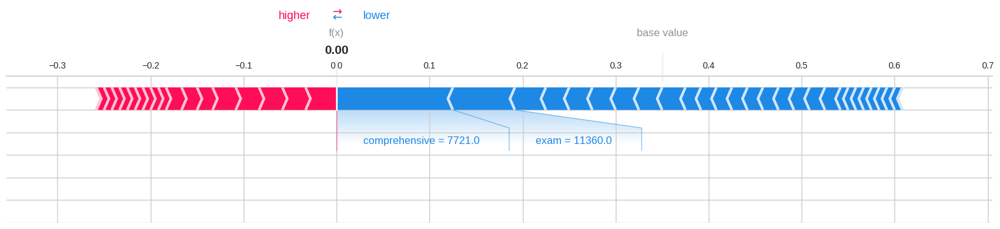

Sentence: society tea instant mas ##ala tea prem ##ix , 1 ##k ##g delicately spice ##d , perfectly blended supreme ##ly convenient , mas ##ala tea prem ##ix , perfect working professionals ' d love quick pick , . simply add hot water prem ##ix minute enjoying pip ##ing hot cup ##pa , indian style . ; Prediction: [0] ; True value: Books


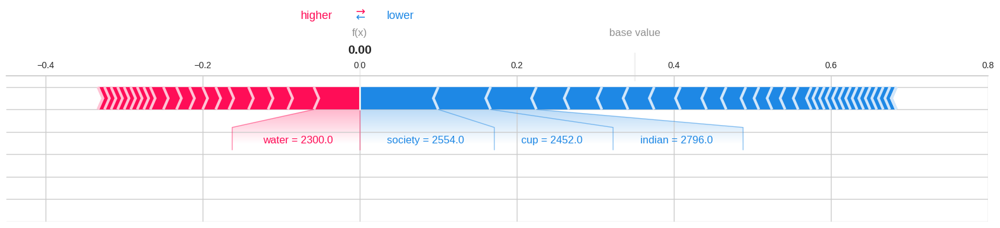

Sentence: to ##shi ##ba can ##vio basic 1 ##t ##b a ##3 usb ##3 . 0 ( black ) ; Prediction: [1] ; True value: Electronics


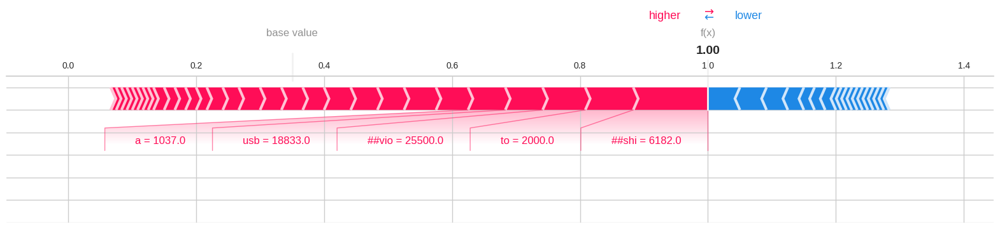

Sentence: learn tamil 30 days english author author : author learn tamil 30 days english krishna go ##pal vi ##kal , authored books learning languages . include learn malayalam 30 days english , learn marathi 30 days hindi learn hindi 30 days malayalam . ; Prediction: [0] ; True value: Books


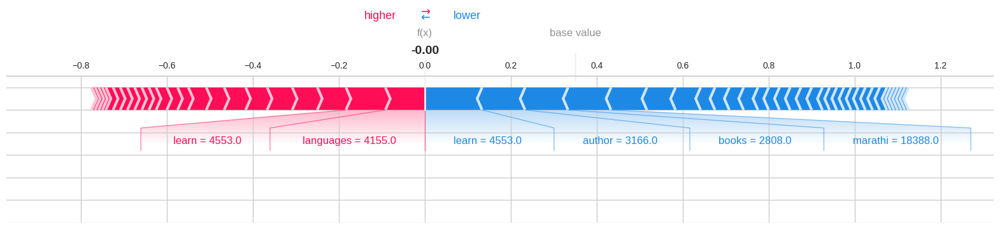

Sentence: born crime author trevor noah comedian south africa . ; Prediction: [0] ; True value: Books


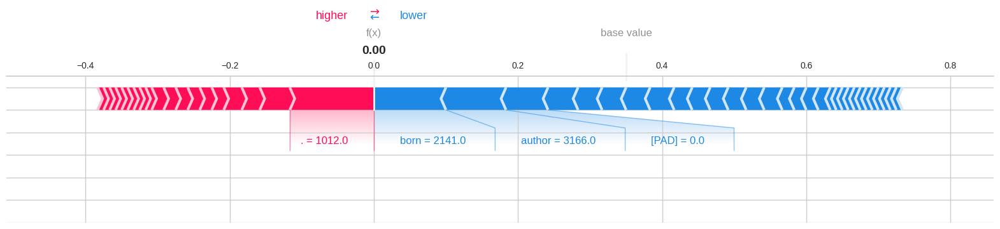

Sentence: statistics economics textbook class - 11 - 110 ##9 ##8 ; Prediction: [0] ; True value: Books


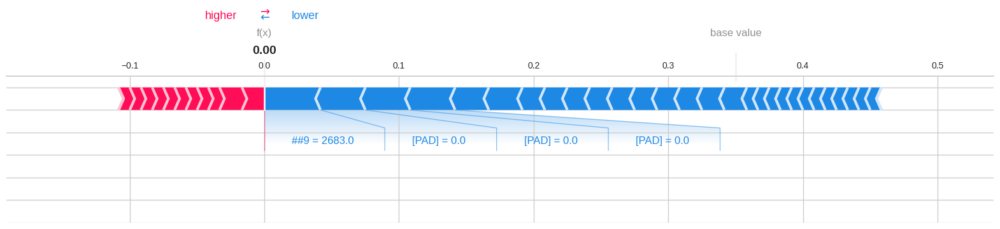

Sentence: amazon ##bas ##ics braid ##ed hd ##mi cable - 3 - feet ; Prediction: [1] ; True value: Electronics


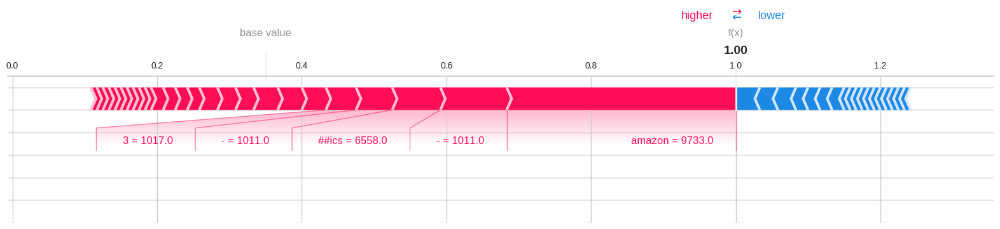

Sentence: hp sp ##rock ##et portable photo printer ( black ) colour : black instant snaps ##hot ##s : create 5 x 7 . 6 cm ( 2 x 3 - inch ) stick ##able snaps ##hot ##s virtually anywhere . the rec ##har ##ge ##able battery prints 30 sheets paper charge , rec ##har ##ges 60 80 minutes . ; Prediction: [1] ; True value: Electronics


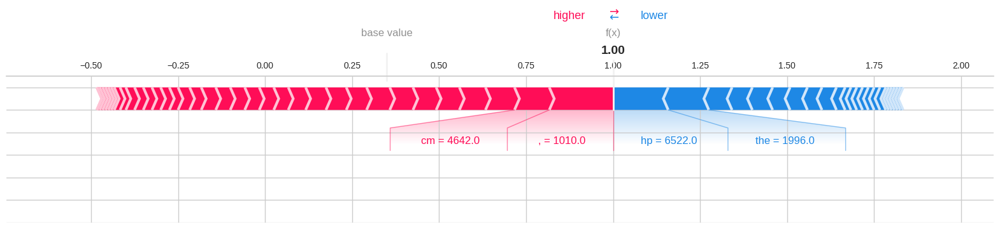

Sentence: 7 laws clearing final author author : ni ##tin son ##i , author best - seller 7 laws clearing final commerce graduate delhi university . son ##i enjoys reading , writing public speaking passionate traveling . currently works investment bank gu ##rga ##on , delhi . ; Prediction: [0] ; True value: Books


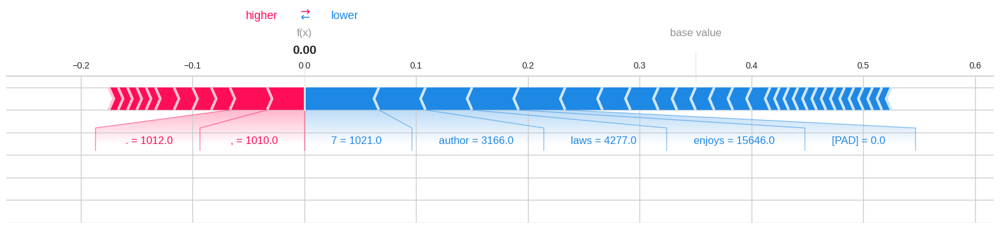

Sentence: log ##ite ##ch c ##9 ##22 ##x pro stream 108 ##0 ##p web ##cam hd video streaming recording 60 ##fp ##s log ##ite ##ch c ##9 ##22 ##x pro stream web ##cam 108 ##0 ##p camera hd video streaming records 60 ##fp ##s 960 - 001 ##17 ##6 . ; Prediction: [1] ; True value: Electronics


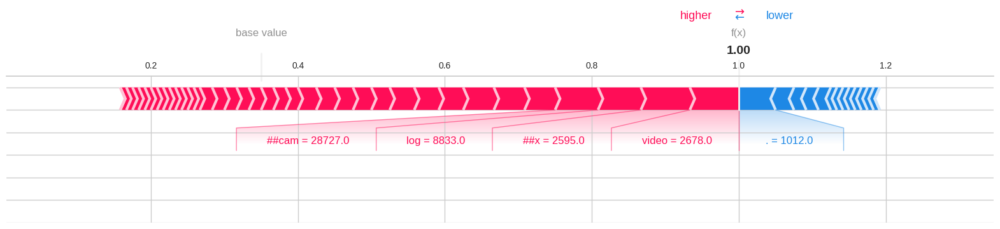

Sentence: review pathology genetics ( pg ##me ##e ) ; Prediction: [0] ; True value: Books


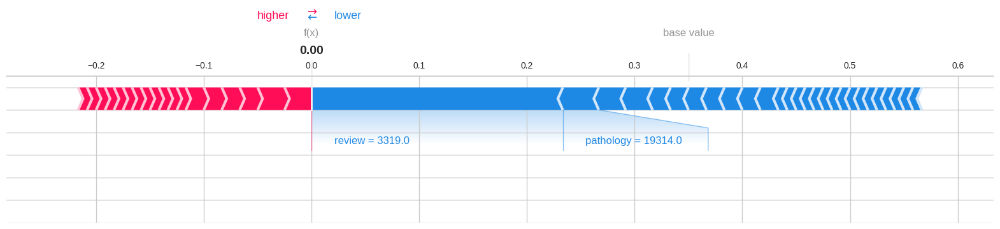

Sentence: solar system ( 100 facts ) ; Prediction: [0] ; True value: Books


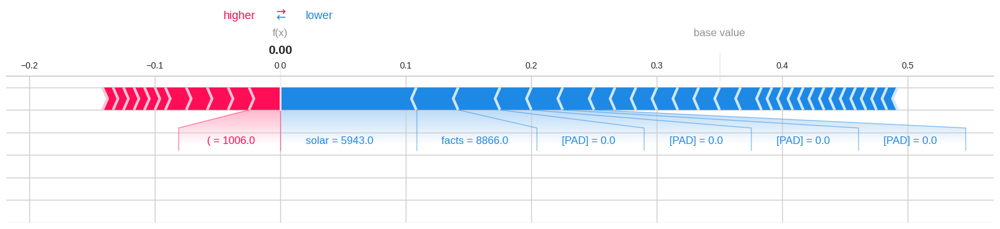

Sentence: society leaf tea premium packet , 1000 ##g crushed , twisted curled tea leaf carefully picked create amalgamation exquisite aroma taste . ct ##c process ensures society tea offers perfect in ##fusion rich color strong flavor providing customer cup ##pa cher ##ish . ; Prediction: [0] ; True value: Books


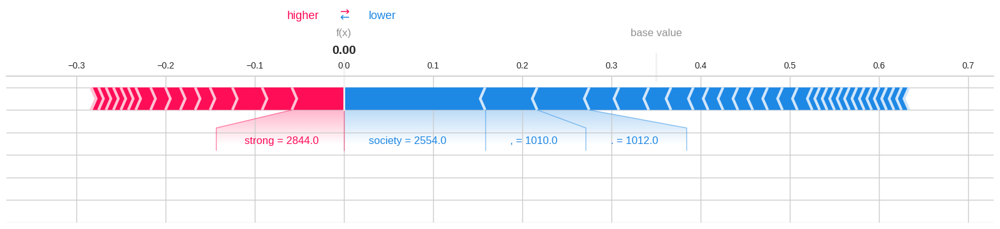

Sentence: biological anthropology : natural history human ##kind author craig stanford ##uni ##vers ##ity southern california , john s . allen ##uni ##vers ##ity southern california , susan c . anton ##ne ##w york university . ; Prediction: [0] ; True value: Books


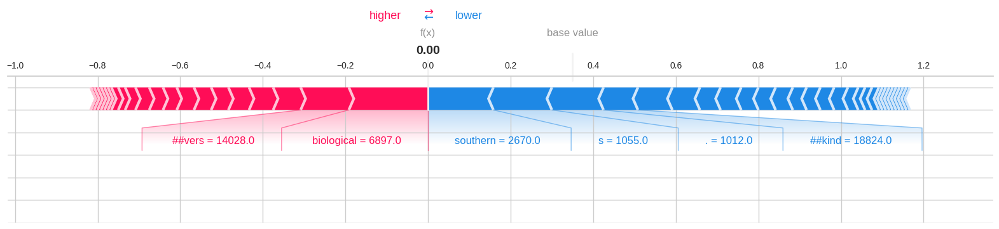

Sentence: amazon brand - sol ##imo board books kids ( set 10 ) ; Prediction: [0] ; True value: Books


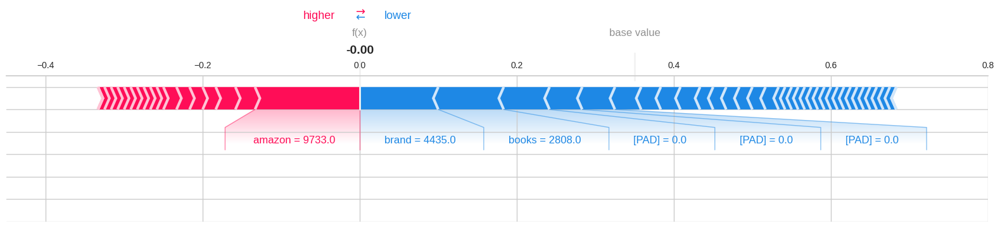

Sentence: civil engineering ( objective type ) ; Prediction: [0] ; True value: Books


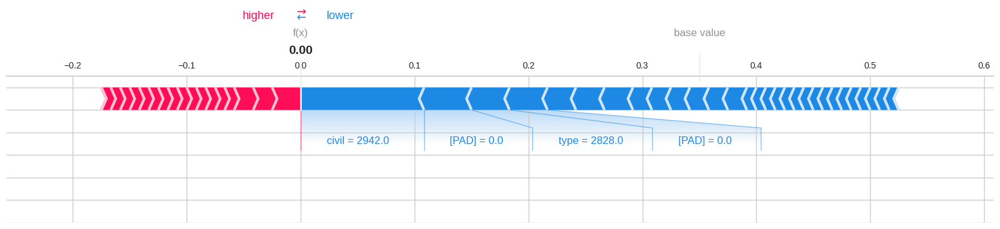

Sentence: l ##g 24 inch border ##less monitor - full hd , ip ##s panel v ##ga , hd ##mi , audio in / out ports in - built speakers - 24 ##mp ##8 ##8 ##h ##v ( silver / white ) full hd ip ##s display narrow borders in ##bu ##il ##t speaker , color cal ##ib ##rated sr ##gb 99 percent . ; Prediction: [1] ; True value: Electronics


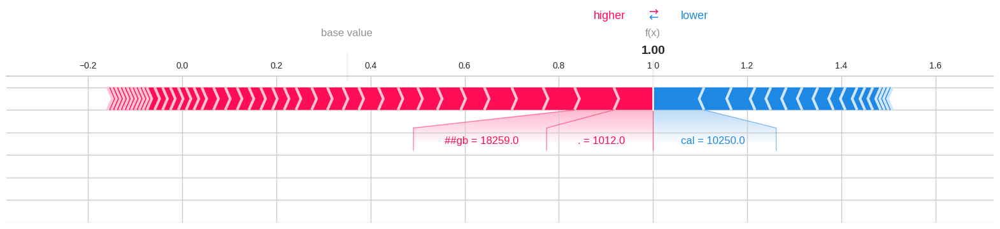

Sentence: ind ##ra no ##oy ##i - biography author author ##anna ##poo ##rna lawyer writer based delhi . ; Prediction: [0] ; True value: Books


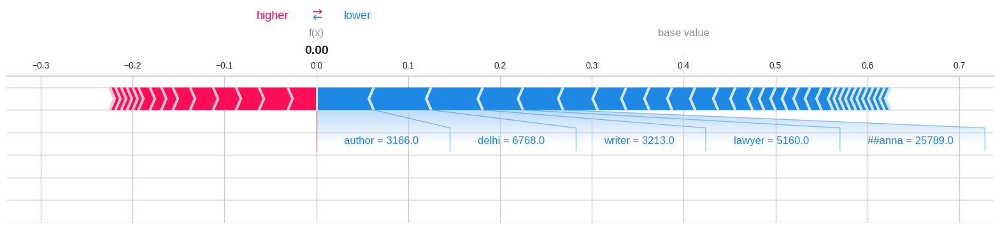

Sentence: sb ##i & ib ##ps bank solved papers - 40 papers ( 2010 - 2017 ) ; Prediction: [0] ; True value: Books


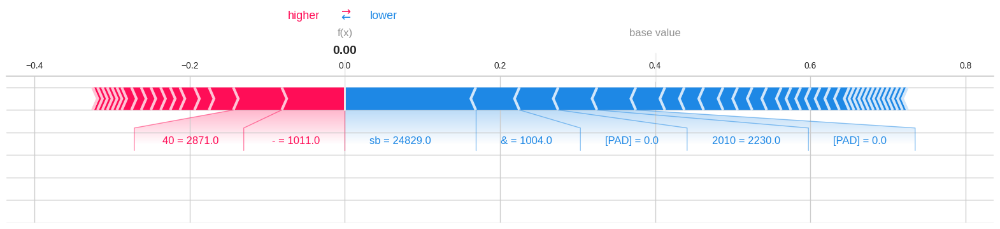

Sentence: india ' s ancient past . . . r . s . sharma product condition : defects . ; Prediction: [0] ; True value: Books


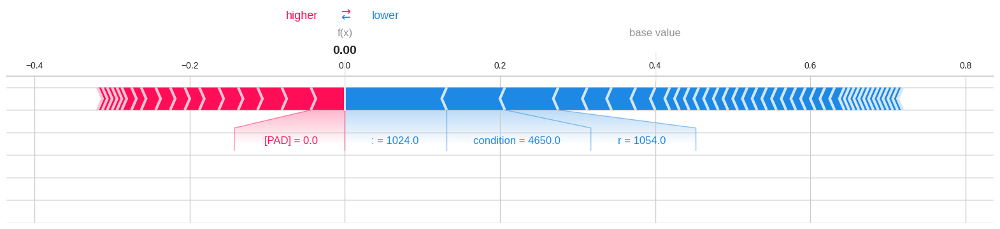

Sentence: ave ##rmed ##ia c2 ##85 game capture hd tv tune ##r card style : game capture hd ##2 ave ##rmed ##ia ' s game capture hd console mate helps collect share in - game scenes . simply connect game console hd ##tv recording 108 ##0 ##p gameplay press away . guess , n ' t pc . ; Prediction: [1] ; True value: Electronics


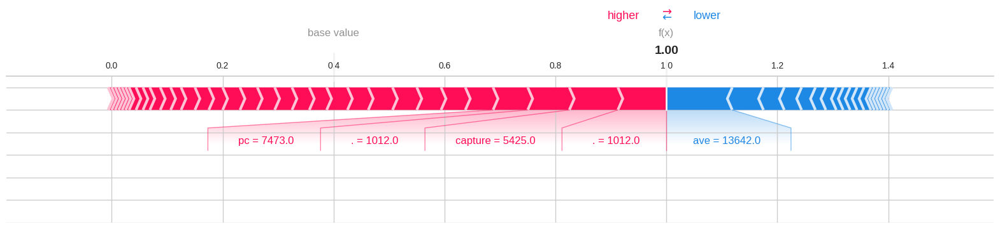

Sentence: d - link des - 100 ##8 ##c 10 / 100 mb ##ps un ##mana ##ged switch network switch 8 port 10 / 100 ##base - t , full half du ##plex transfer port , 802 . 3 ##x flow control full du ##plex , ieee ##80 ##2 . 3a ##z compliant . ; Prediction: [1] ; True value: Electronics


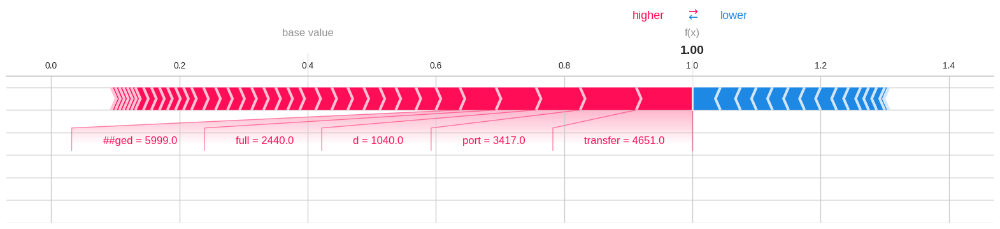

Sentence: sony u ##b ##p - x ##70 ##0 4 ##k ultra hd blu - ray player ( black ) seat house 4 ##k ultra hd blu - ray ##™ player . lose cinema tv shows high dynamic range . ; Prediction: [1] ; True value: Electronics


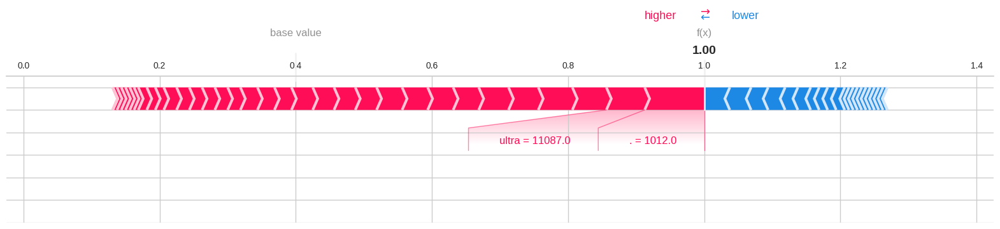

Sentence: dracula : illustrated classics ( illustrated classics ) ; Prediction: [0] ; True value: Books


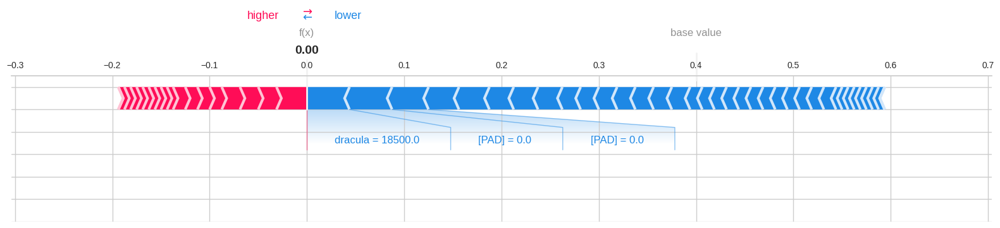

Sentence: swam ##y ’ handbook 2019 - english edition central government staff ( diary 2019 free long stocks ) forty edition incorporating latest orders based seventh pay commission report . ; Prediction: [1] ; True value: Books


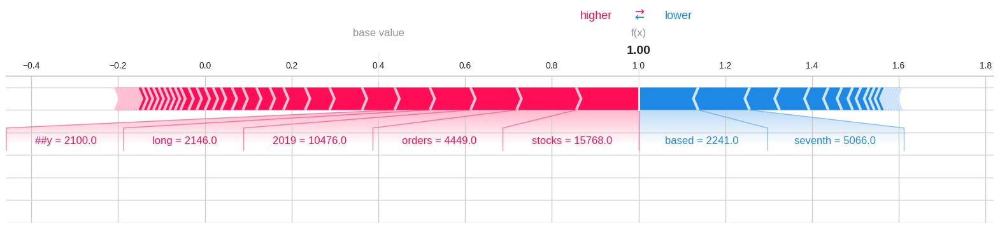

Sentence: gu ##lli ##ver ' s travels ; Prediction: [0] ; True value: Books


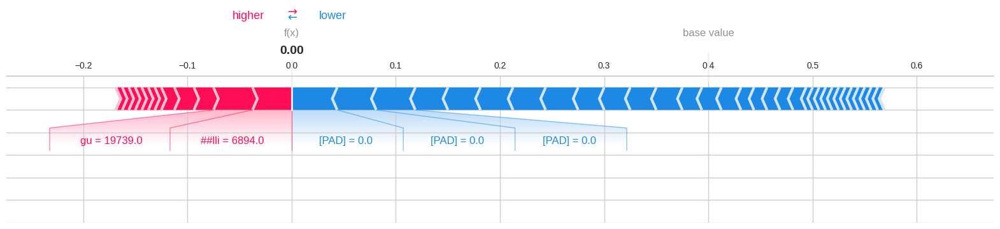

Sentence: esa ##w medical microscope led 50 prepared slides ( white ) glass optics , focal , centered , high numerical aperture , high resolution special coating effect moisture , fungus , fog ##gin ##ess weather effect passage time . ; Prediction: [1] ; True value: Electronics


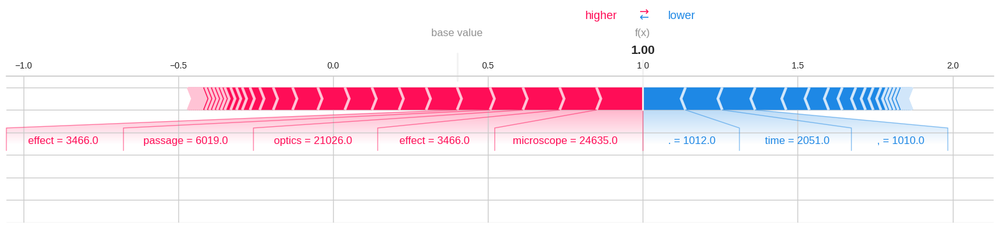

Sentence: hem ##i sync meta ##music sample ##r ; Prediction: [0] ; True value: Electronics


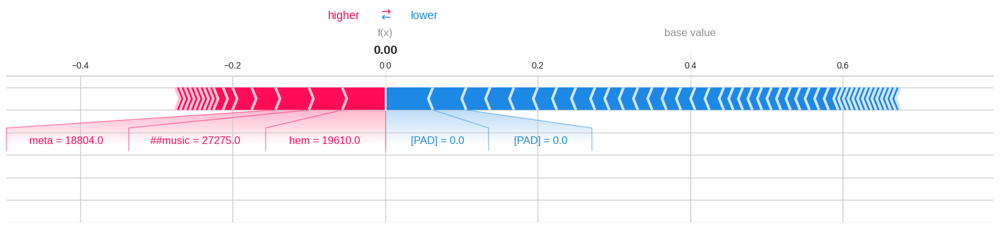

Sentence: roam ##s prime ##s supplement ( 2018 ) pg ##me ##e books ; Prediction: [0] ; True value: Books


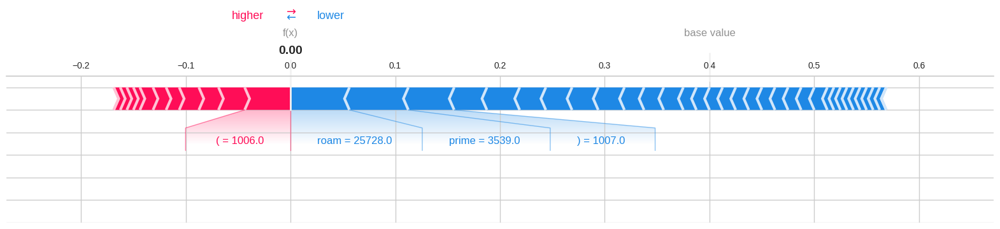

Sentence: colour cr ##ayo ##ns - part 1 ; Prediction: [0] ; True value: Books


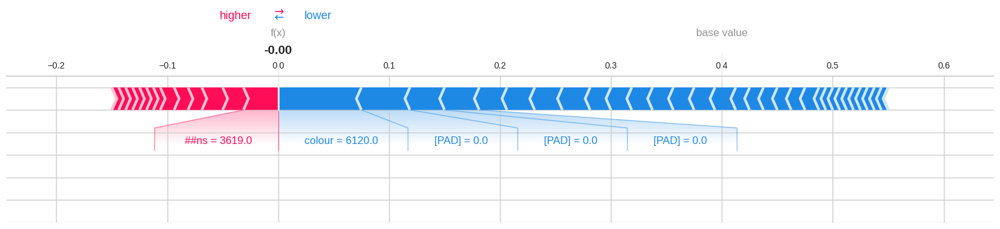

Sentence: cas ##io nj - 120 ##d - bu portable cal ##cula ##tor ( blue ) * 12 digits . * extra large display . * local ##ised number system . * 150 checks check . * review & auto review . * dual power - solar / battery * 3 years warrant ##y cas ##io india ; Prediction: [0] ; True value: Electronics


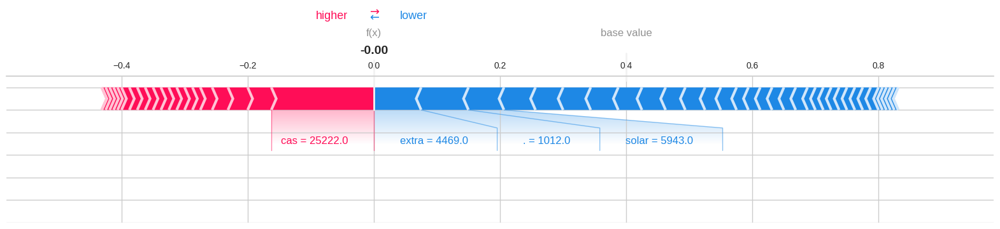

Sentence: trim ##fi ##t boys cotton / span ##de ##x tag ##less colorful briefs 5 - pack ; Prediction: [1] ; True value: Books


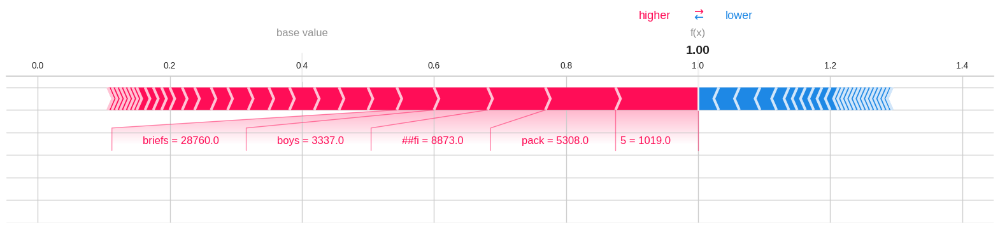

Sentence: principles practices banking ; Prediction: [0] ; True value: Books


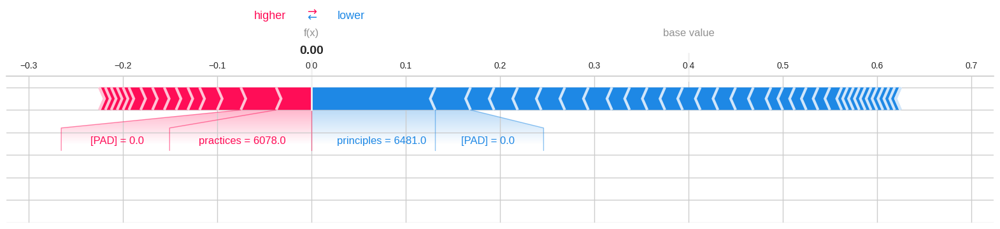

Sentence: sy ##vo 311 ##0 fold ##able camera trip ##od mobile clip holder bracket , fully flexible mount trip ##od , stand ##with 3d head & quick release plate ( black ) ; Prediction: [1] ; True value: Electronics


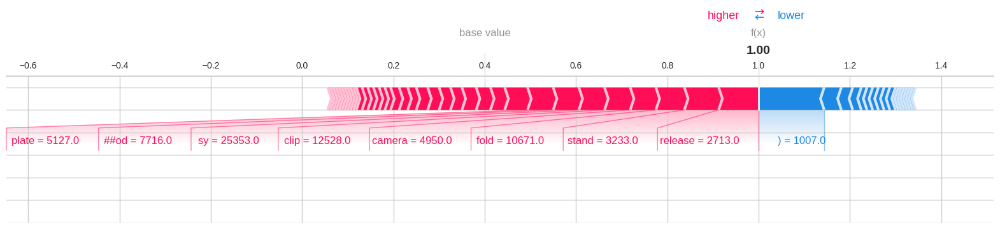

Sentence: 19 . 5 inch ( 49 . 41 cm ) led monitor - hd , tn panel v ##ga port - e ##20 ##16 ##h ##v ( black ) note : inca ##se issue , kindly contact brand 1800 - 425 - 402 ##6 – fr ##i ( 9 – 6 ##pm ) sat ( 9 - 6 ##pm ) . ; Prediction: [1] ; True value: Electronics


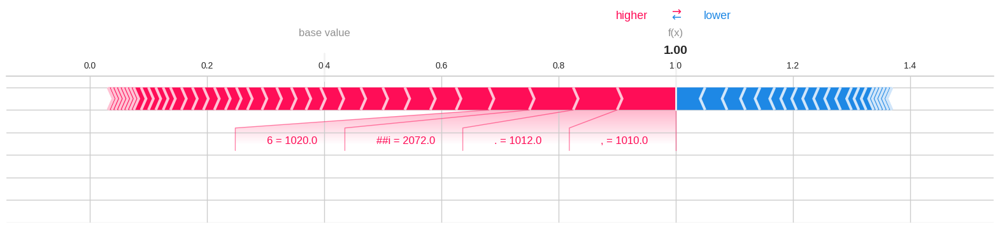

Sentence: politics india independence textbook political science class - 12 - 121 ##19 ; Prediction: [0] ; True value: Books


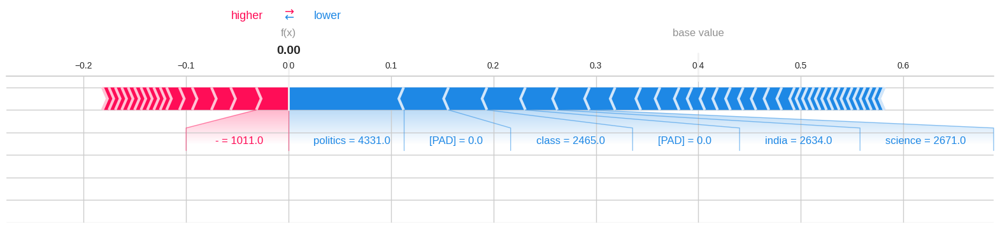

Sentence: cam ##lin ko ##ku ##yo cadet engineering instruments ; Prediction: [0] ; True value: Books


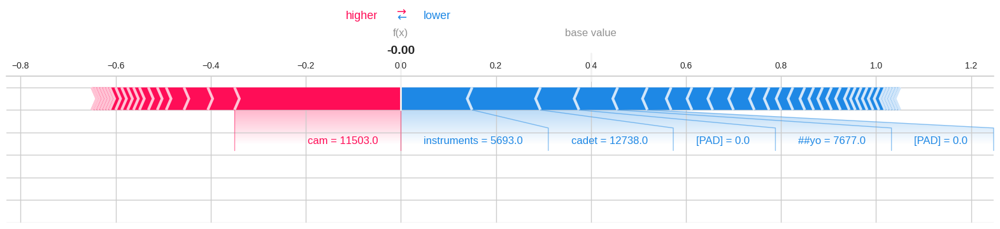

Sentence: official gr ##e quantitative reasoning practice questions ; Prediction: [0] ; True value: Books


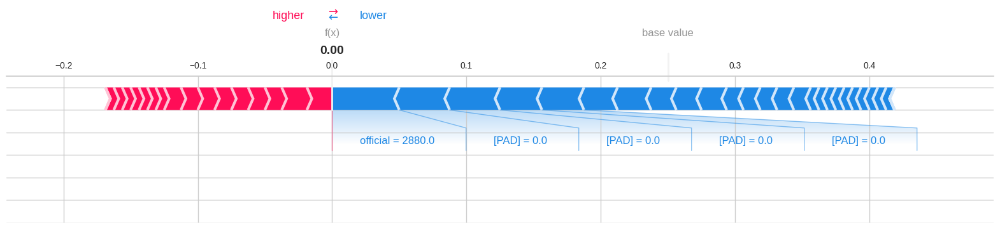

Sentence: learn kannada 30 days author author : krishna go ##pal vi ##kal author similar books languages learn malayalam 30 days english , learn tamil 30 days english , learn gujarati 30 days english learn hindi 30 days english . ; Prediction: [0] ; True value: Books


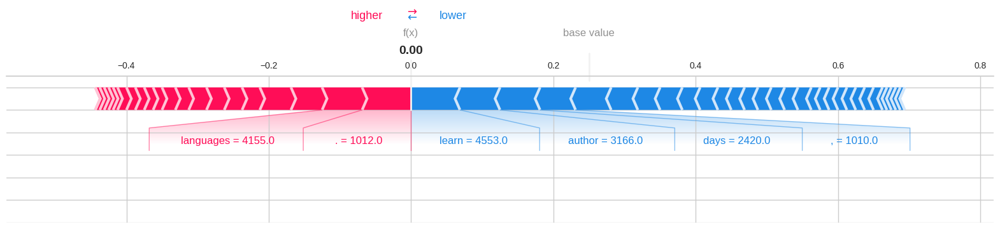

Sentence: tech ##life tech ##00 ##9 plastic waist camera belt cameras ( black ) ds ##lr camera hard plastic waist belt buckle button suitable canon 5 ##d , 7 ##d , 550 ##d , 1200 ##d nik ##on cameras . ; Prediction: [1] ; True value: Electronics


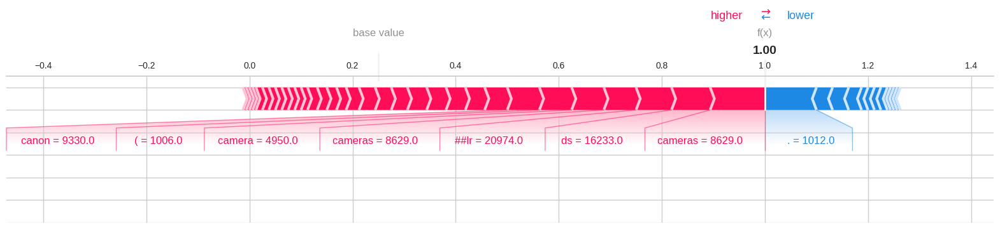

Sentence: general studies paper : civil services preliminary examination 2019 pearson author show ##ick thorpe expert competitive examinations . authored 40 books english , hindi bang ##la languages , catering competitive examinations career development . ; Prediction: [0] ; True value: Books


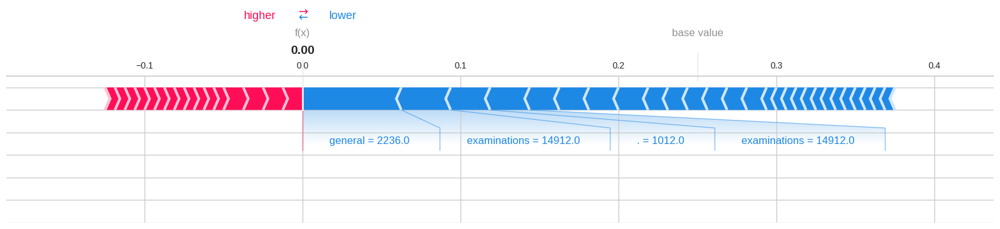

Sentence: sai ##nik school entrance exam guide class ; Prediction: [0] ; True value: Books


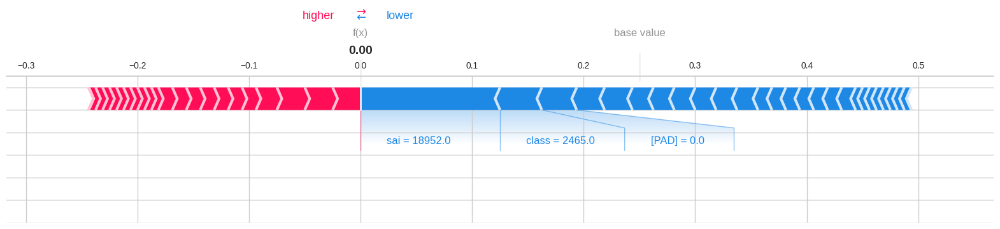

Sentence: grow rich ; Prediction: [0] ; True value: Books


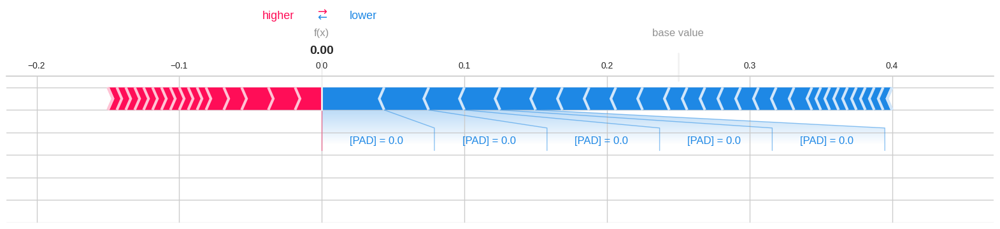

Sentence: art ; Prediction: [0] ; True value: Books


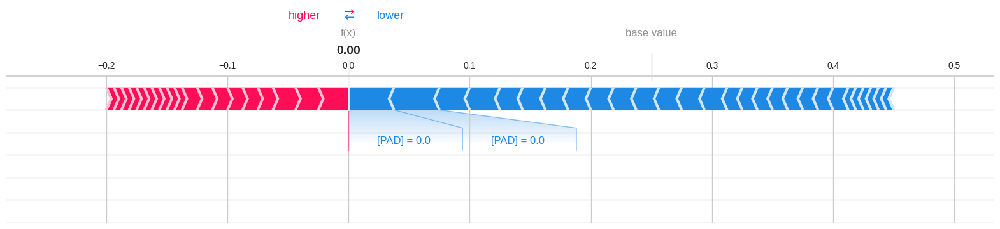

Sentence: indian economy key concepts published ka ##vin mu ##kh ##il publications ( associate gan ##esh ia ##s academy ) . edition , con ##se ##quent introduction gs ##t chapter public finance updated . w ##pi updated based 2011 - 12 base year series . mind mapping important feature added edition . ; Prediction: [0] ; True value: Books


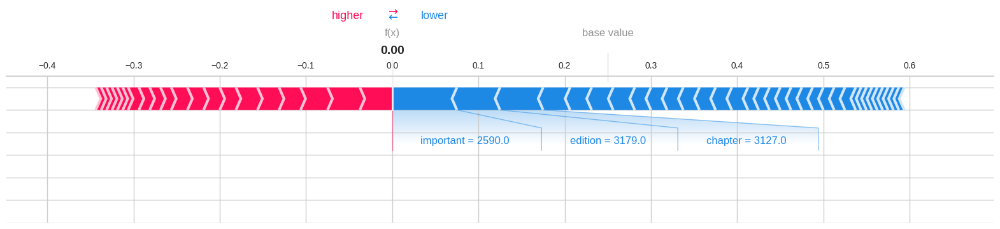

Sentence: religions book ( big ideas ) review fascinating material , presented ( jon sutton psychologist ( review psychology book ) ) ; Prediction: [0] ; True value: Books


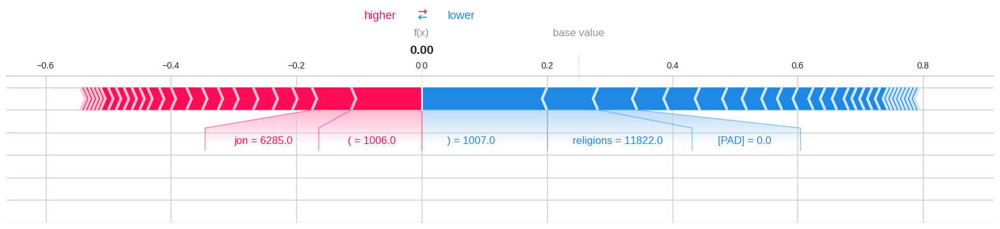

Sentence: guide cl ##at & ll . b . entrance examination ; Prediction: [0] ; True value: Books


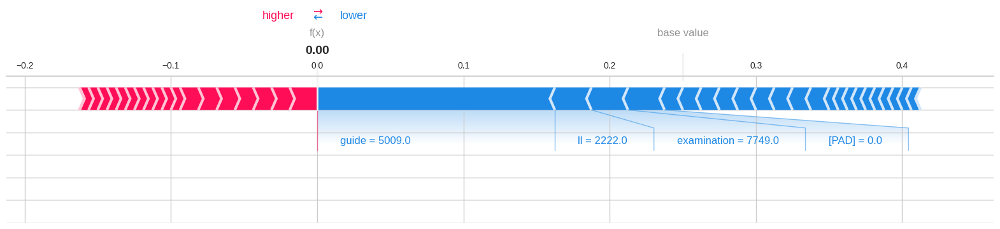

Sentence: principles practices banking ; Prediction: [0] ; True value: Books


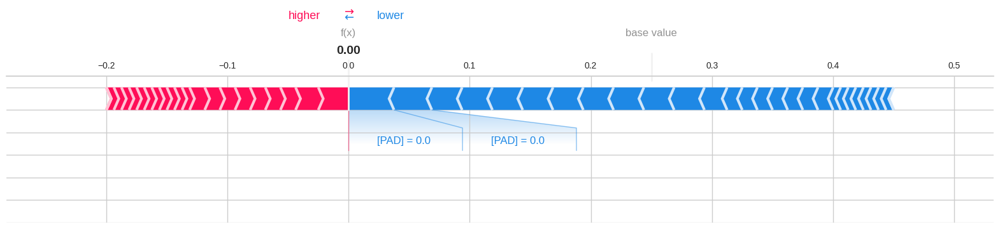

Sentence: music ( d ##k ) review imposing en ##cy ##cl ##opa ##ed ##ia devoted musical , primitive instruments 10 , 000 present day . . . . . . lifting it - effort - coffee table , bound find reference . inform ##ative entertaining read . ( gs lady 2013 - 11 - 15 ) ; Prediction: [0] ; True value: Books


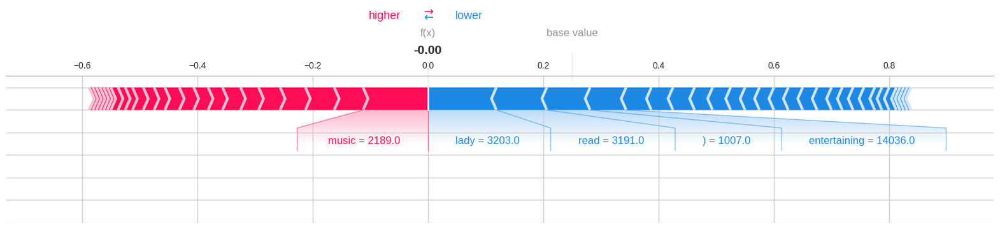

Sentence: bank interviews ib ##ps ( cw ##e ) successful candidates ; Prediction: [0] ; True value: Books


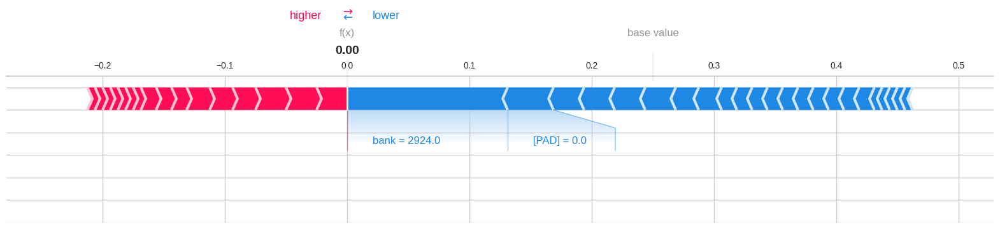

Sentence: amazon ##bas ##ics usb 3 . 1 type - c 4 port usb hub - black ; Prediction: [1] ; True value: Electronics


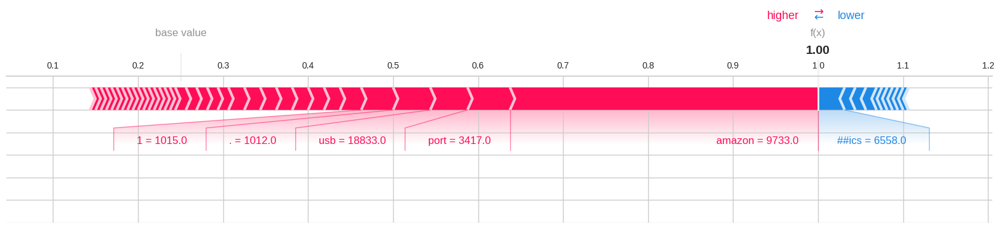

Sentence: sigma 19 ##mm f / 2 . 8 d ##n art lens sony e - mount cameras fast large aperture lens mirror - less camera systems . front & rear lens caps & carrying case . typical photography : travel , landscape , wedding & events , specialty . ; Prediction: [1] ; True value: Electronics


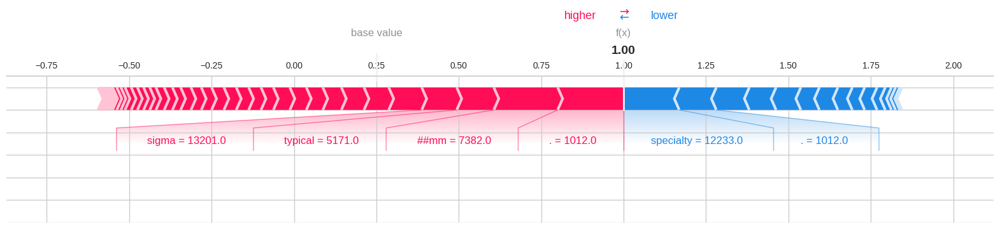

Sentence: barron ` ie ##lts practice exams ; Prediction: [0] ; True value: Books


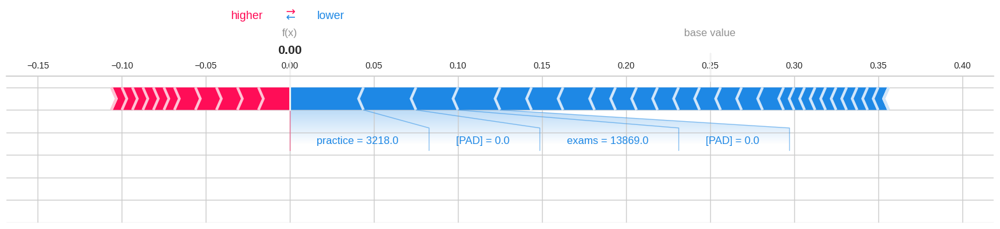

Sentence: kiran ’ ups ##c essays solved papers 1993 date - 237 ##1 ; Prediction: [0] ; True value: Books


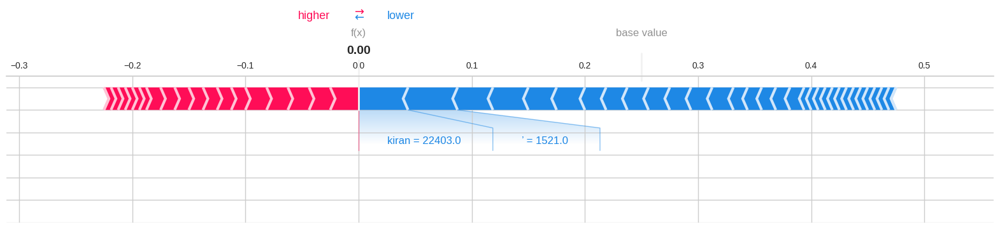

Sentence: l ##g 24 ##x internal dvd writer ( black grey ) l ##g super - multi internal dvd re ##writer features 24 ##x dvd write speed 48 ##x write speed cd - r . designed storage demand consistency , reads writes cd , dvd , dvd dvd ram formats giving option choose media suited task . ; Prediction: [1] ; True value: Electronics


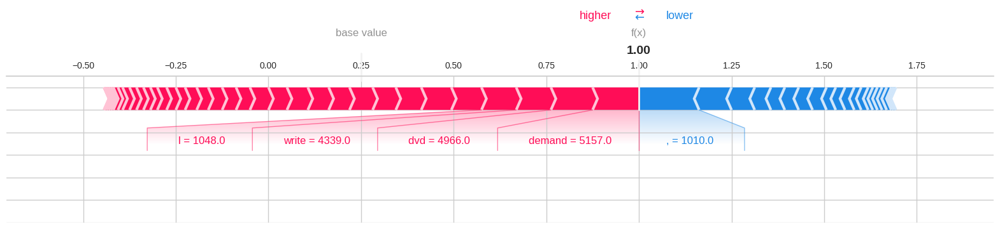

Sentence: cables ka ##rt 2 port manual v ##ga split ##ter v ##ga split ##ter cc ##tv system set . switch cc ##tv screen pc output 2 v ##ga split ##ter image showing 2 sides single product . note single pc order . ; Prediction: [0] ; True value: Electronics


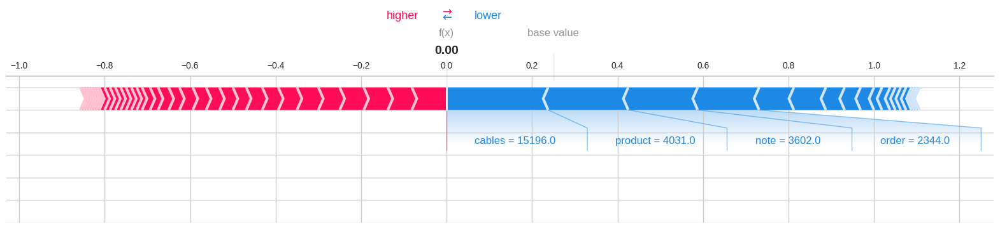

Sentence: mob ##imi ##nt action camera 108 ##0 ##p 12 ##mp sports camera full hd 2 . 0 inch action 30 ##m / 98 ##ft underwater water ##proof camera mounting accessories kit ( silver ) ; Prediction: [1] ; True value: Electronics


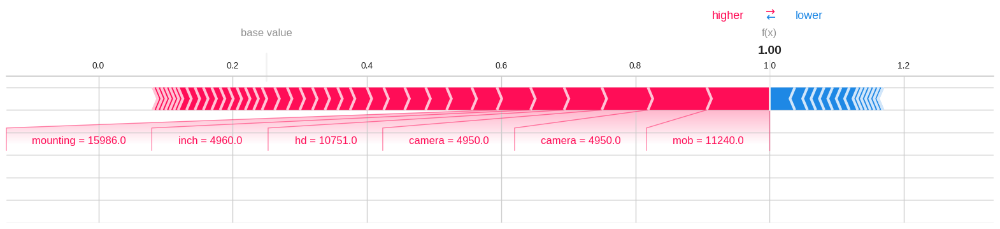

In [34]:
for i in range(len(to_explain)):
  print("Sentence:", " ".join(tokenizer.convert_ids_to_tokens(to_explain[i])).replace(" [PAD]", "") ,"; Prediction:", prediction_model(np.array([to_explain[i]])), "; True value:", y_test[i])
  shap.plots.force(perm_vals["base_values"][i], perm_vals["values"][i], perm_vals["data"][i], feature_names=tokenizer.convert_ids_to_tokens(perm_vals["data"][i]), matplotlib=True)

In [35]:
import copy
heatmaps = np.array(copy.copy(perm_vals["values"]))
heatmaps += perm_vals["base_values"][0]/64
for i in range(len(heatmaps)):
  print(np.sum(heatmaps[i]))

0.0
1.3877787807814457e-17
1.0
1.0
-5.204170427930421e-18
0.9999999999999999
2.7755575615628914e-17
1.0
1.3877787807814457e-17
6.938893903907228e-18
0.9999999999999998
1.0
-2.7755575615628914e-17
1.0
1.0
0.9999999999999999
-1.3877787807814457e-17
-2.7755575615628914e-17
3.469446951953614e-18
2.7755575615628914e-17
1.1
1.0999999999999999
0.10000000000000003
0.10000000000000002
0.10000000000000006
0.10000000000000014
0.09999999999999998
1.1
0.1
1.1
0.10000000000000002
0.10000000000000002
1.1
0.1
0.10000000000000006
1.1
0.10000000000000002
0.10000000000000003
1.1
0.09999999999999998
0.10000000000000005
1.0999999999999999
1.1
0.10000000000000003
0.10000000000000006
1.1
0.10000000000000003
0.10000000000000007
0.1
1.1
1.1
0.10000000000000006
1.1
0.1
0.10000000000000005
0.09999999999999999
0.1000000000000002
0.1
0.10000000000000007
1.1
0.05000000000000002
0.04999999999999999
0.05000000000000002
1.05
1.05
1.05
0.05
1.0499999999999998
0.05
1.0499999999999998
0.05
0.05000000000000004
0.049999999

In [36]:
def explanation_converter(explanations):
  new_explanations = []
  for i in range(len(explanations)):
    if (np.sum(explanations[i]) > 0):
      new_explanations.append(explanations[i] + (1 - np.sum(explanations[i]))/64)
    else:
      new_explanations.append(-explanations[i] + (1 + np.sum(explanations[i]))/64)
  return new_explanations
standardized_explanations = explanation_converter(perm_vals["values"])

In [37]:
for x in standardized_explanations:
  print(np.sum(x))
print(standardized_explanations)

1.0
1.0
1.0
1.0
1.0
1.0
1.0
0.9999999999999998
1.0
1.0
1.0
1.0
1.0
1.0
1.0
0.9999999999999999
1.0
1.0
1.0
1.0
1.0
0.9999999999999999
1.0
1.0
1.0
1.0
0.9999999999999999
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
0.9999999999999999
1.0
0.9999999999999999
1.0
1.0
1.0
1.0
1.0000000000000002
1.0
1.0
0.9999999999999999
1.0
1.0
0.9999999999999999
0.9999999999999999
1.0
0.9999999999999999
1.0
1.0000000000000002
1.0
1.0
1.0
1.0
1.0
1.0
0.9999999999999999
1.0
1.0
0.9999999999999998
1.0000000000000002
1.0
1.0
1.0
0.9999999999999999
0.9999999999999999
1.0
0.9999999999999998
0.9999999999999998
1.0
1.0
1.0
1.0
0.9999999999999999
1.0
1.0
1.0000000000000002
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
0.9999999999999999
1.0
1.0
0.9999999999999999
1.0
1.0
1.0
1.0
1.0000000000000002
1.0
[array([ 0.12734375,  0.02109375,  0.01484375, -0.01015625, -0.00390625,
        0.03359375,  0.03984375,  0.02734375,  0.05859375,  0.03984375,
       -0.02890625,  0.02734375,  0.00859375,  0.02734375,  0.01484375,
        0.01484375,  0.

In [38]:
sentences = []
sentence_explanations = []
sentence_heatmap = []
for i in range(len(to_explain)):
    sentence = []
    exp = []
    hm = []
    j = 0
    while j < len(to_explain[i]):
        if (tokenizer.convert_ids_to_tokens([to_explain[i][j]])[0].startswith("##")):
            sentence[-1] += tokenizer.convert_ids_to_tokens([to_explain[i][j]])[0][2:]
            exp[-1] += standardized_explanations[i][j]
            hm[-1] += heatmaps[i][j]
        else:
            sentence.append(tokenizer.convert_ids_to_tokens([to_explain[i][j]])[0])
            exp.append(standardized_explanations[i][j])
            hm.append(heatmaps[i][j])
        j += 1
    sentences.append(sentence)
    sentence_explanations.append(exp)
    sentence_heatmap.append(hm)

Prediction: Books


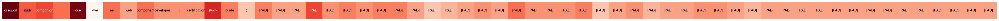

Prediction: Books


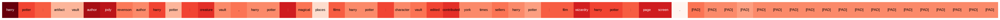

Prediction: Electronics


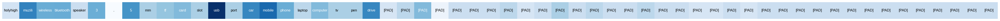

Prediction: Electronics


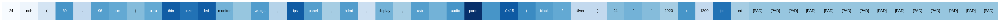

Prediction: Books


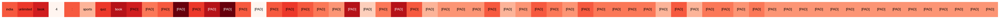

Prediction: Electronics


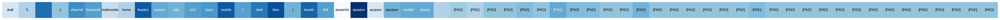

Prediction: Books


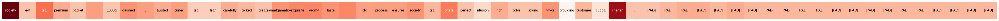

Prediction: Electronics


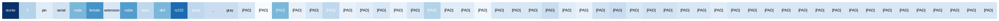

Prediction: Books


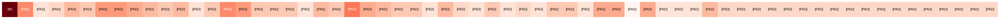

Prediction: Books


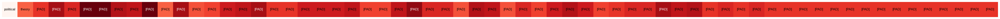

Prediction: Electronics


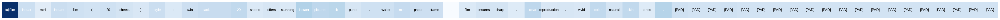

Prediction: Electronics


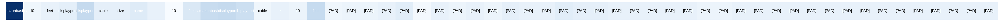

Prediction: Books


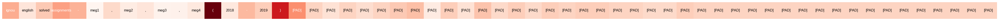

Prediction: Electronics


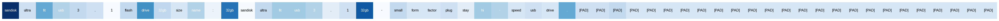

Prediction: Electronics


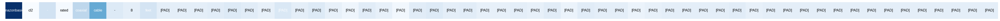

Prediction: Electronics


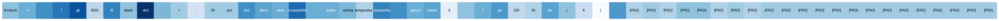

Prediction: Books


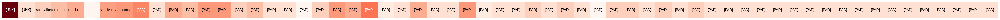

Prediction: Books


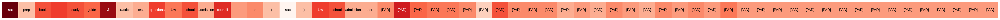

Prediction: Books


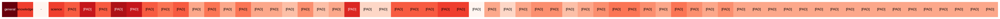

Prediction: Books


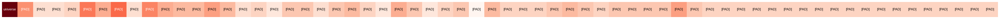

Prediction: Electronics


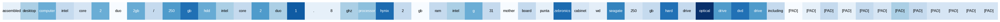

Prediction: Electronics


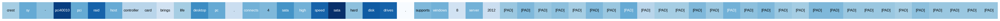

Prediction: Books


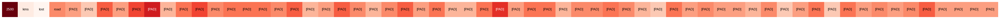

Prediction: Books


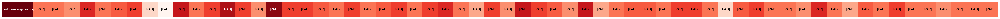

Prediction: Books


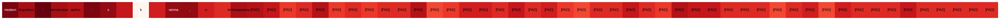

Prediction: Books


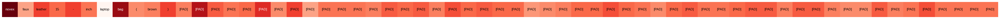

Prediction: Books


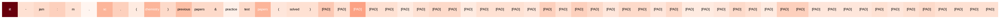

Prediction: Electronics


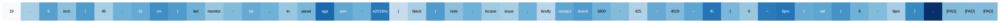

Prediction: Books


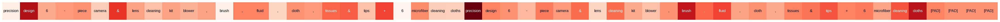

Prediction: Electronics


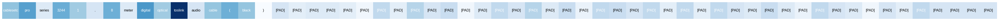

Prediction: Books


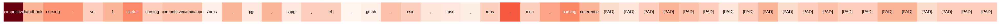

Prediction: Books


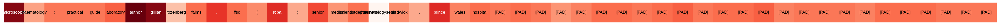

Prediction: Electronics


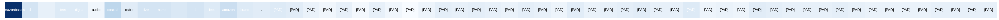

Prediction: Books


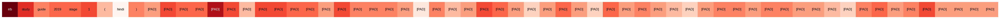

Prediction: Books


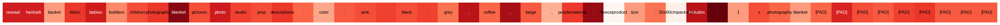

Prediction: Electronics


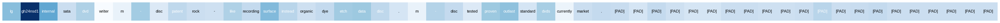

Prediction: Books


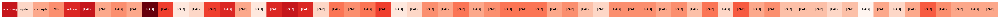

Prediction: Books


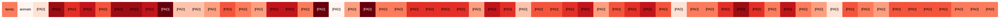

Prediction: Electronics


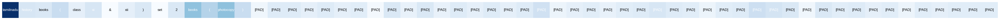

Prediction: Books


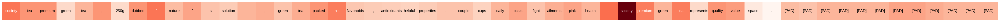

Prediction: Books


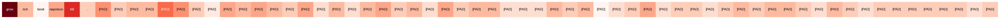

Prediction: Electronics


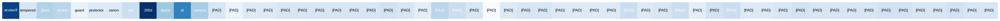

Prediction: Electronics


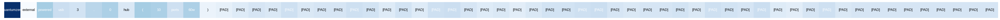

Prediction: Books


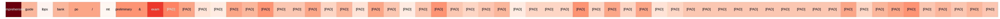

Prediction: Books


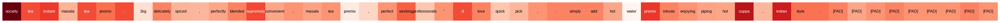

Prediction: Electronics


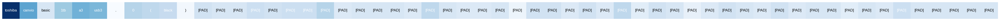

Prediction: Books


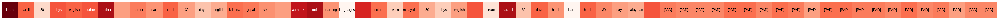

Prediction: Books


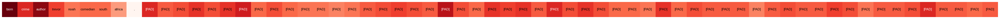

Prediction: Books


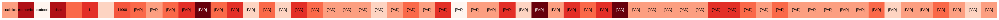

Prediction: Electronics


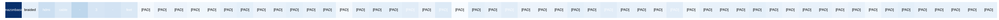

Prediction: Electronics


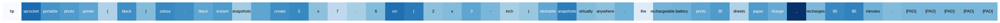

Prediction: Books


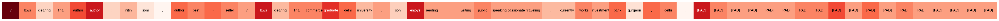

Prediction: Electronics


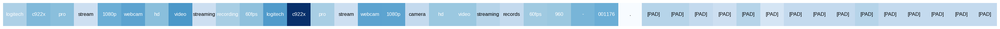

Prediction: Books


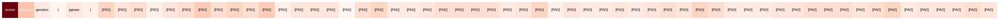

Prediction: Books


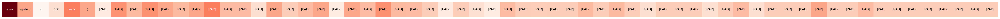

Prediction: Books


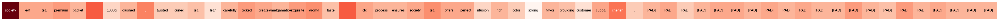

Prediction: Books


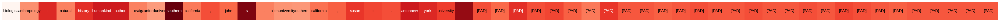

Prediction: Books


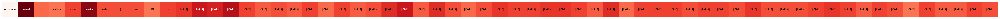

Prediction: Books


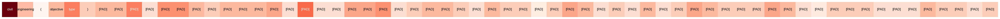

Prediction: Electronics


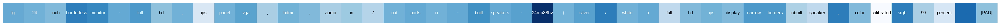

Prediction: Books


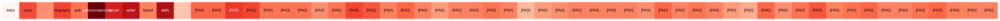

Prediction: Books


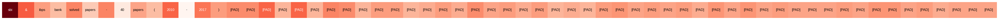

Prediction: Books


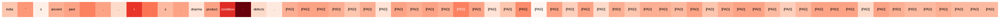

Prediction: Electronics


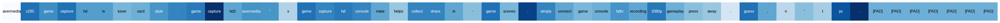

Prediction: Electronics


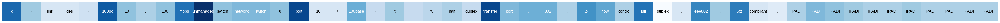

Prediction: Electronics


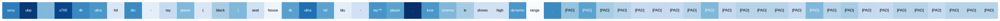

Prediction: Books


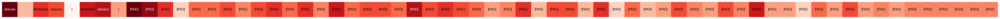

Prediction: Electronics


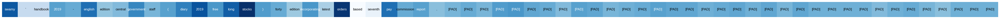

Prediction: Books


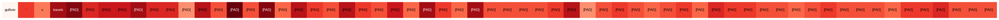

Prediction: Electronics


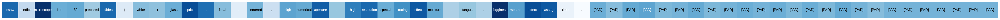

Prediction: Books


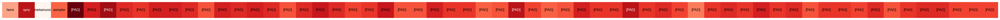

Prediction: Books


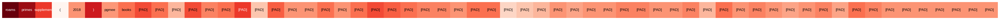

Prediction: Books


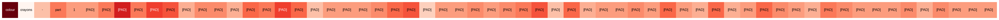

Prediction: Books


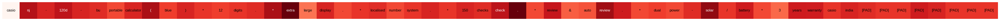

Prediction: Electronics


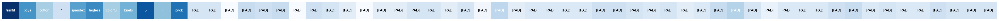

Prediction: Books


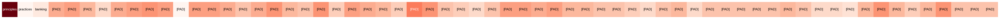

Prediction: Electronics


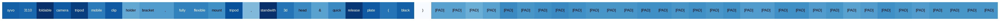

Prediction: Electronics


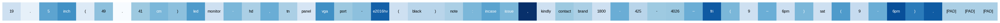

Prediction: Books


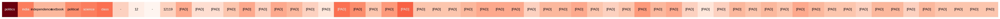

Prediction: Books


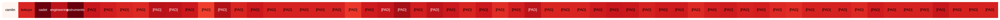

Prediction: Books


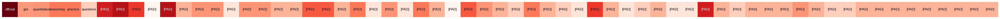

Prediction: Books


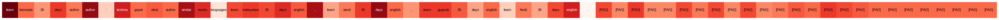

Prediction: Electronics


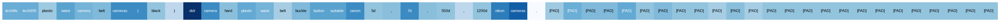

Prediction: Books


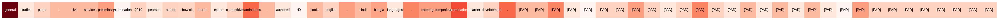

Prediction: Books


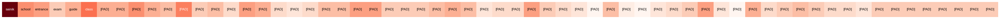

Prediction: Books


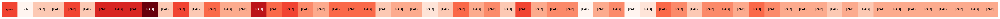

Prediction: Books


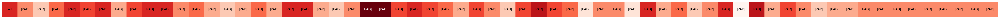

Prediction: Books


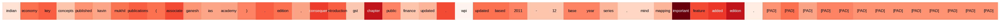

Prediction: Books


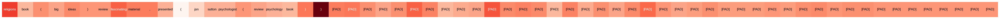

Prediction: Books


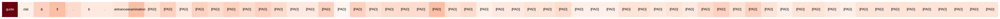

Prediction: Books


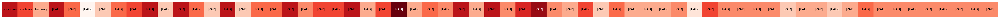

Prediction: Books


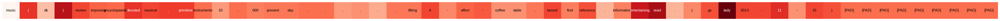

Prediction: Books


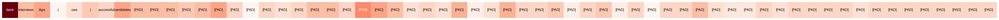

Prediction: Electronics


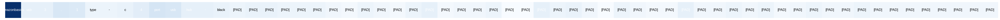

Prediction: Electronics


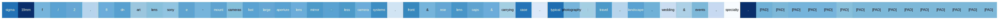

Prediction: Books


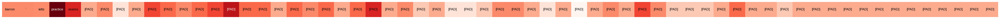

Prediction: Books


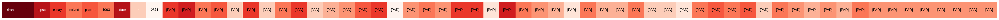

Prediction: Electronics


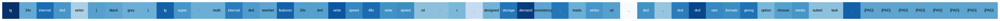

Prediction: Books


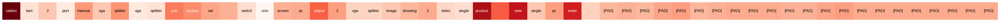

Prediction: Electronics


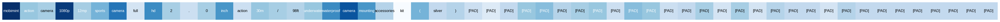

In [39]:
for x in range(len(sentences)):
  fig, ax = plt.subplots(figsize=(len(sentences[x]), 1))
  if prediction_model(np.array([to_explain[x]]))[0] == 0:
    print("Prediction: Books")
    ax.imshow([-np.array(sentence_heatmap[x])], cmap="Reds", aspect="auto")
    ax.axis("off")
    for i, word in enumerate(sentences[x]):
      color = plt.cm.Blues(sentence_heatmap[x][i])
      ax.text(i, 0, word, ha="center", va="center", fontsize="12", color="white" if sentence_heatmap[x][i] < -0.02 else "black")#color="white" if heatmaps[x][i] > 0.5 else "black", bbox=dict(facecolor=color, edgecolor=color, pad=1))
  else:
    print("Prediction: Electronics")
    ax.imshow([sentence_heatmap[x]], cmap="Blues", aspect="auto")
    ax.axis("off")
    for i, word in enumerate(sentences[x]):
      color = plt.cm.Blues(sentence_heatmap[x][i])
      ax.text(i, 0, word, ha="center", va="center", fontsize="12", color="white" if sentence_heatmap[x][i] > 0.02 else "black")#color="white" if heatmaps[x][i] > 0.5 else "black", bbox=dict(facecolor=color, edgecolor=color, pad=1))


  plt.show()

Prediction: Books


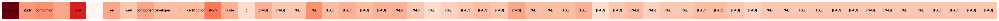

Prediction: Books


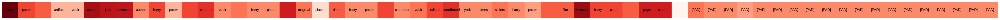

Prediction: Electronics


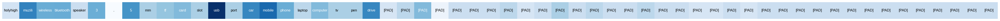

Prediction: Electronics


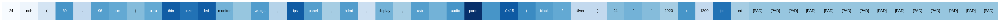

Prediction: Books


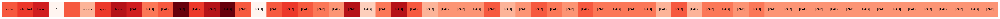

Prediction: Electronics


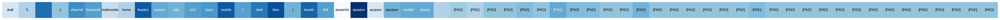

Prediction: Books


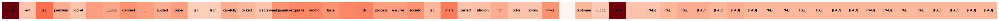

Prediction: Electronics


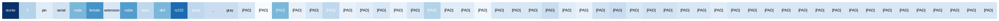

Prediction: Books


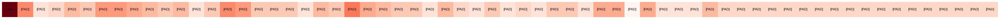

Prediction: Books


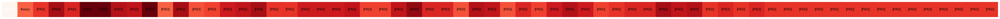

Prediction: Electronics


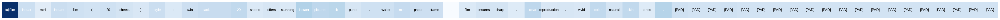

Prediction: Electronics


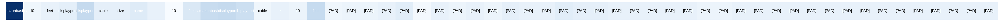

Prediction: Books


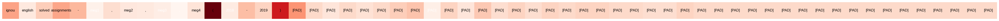

Prediction: Electronics


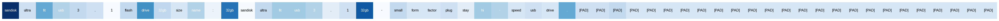

Prediction: Electronics


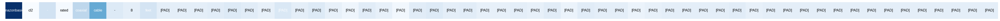

Prediction: Electronics


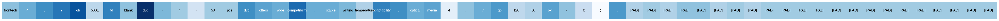

Prediction: Books


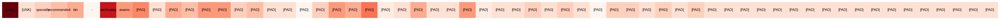

Prediction: Books


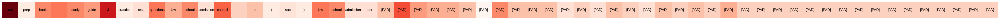

Prediction: Books


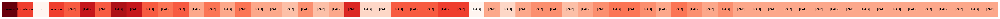

Prediction: Books


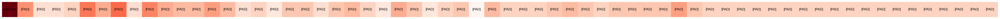

Prediction: Electronics


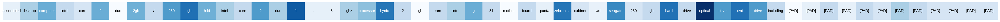

Prediction: Electronics


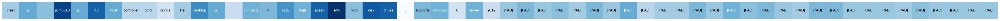

Prediction: Books


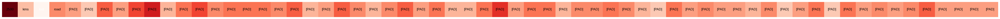

Prediction: Books


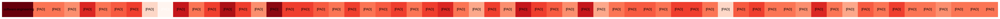

Prediction: Books


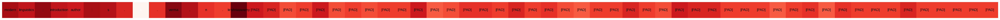

Prediction: Books


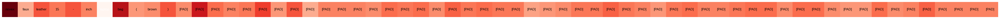

Prediction: Books


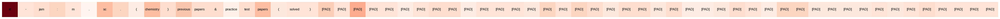

Prediction: Electronics


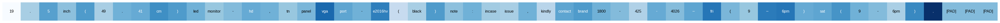

Prediction: Books


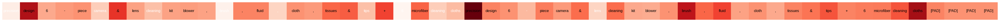

Prediction: Electronics


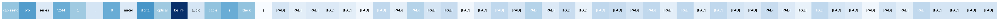

Prediction: Books


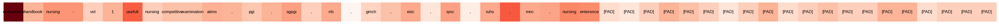

Prediction: Books


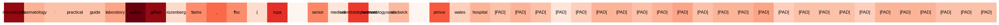

Prediction: Electronics


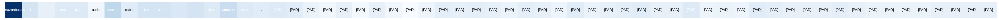

Prediction: Books


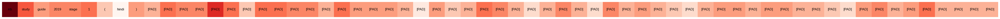

Prediction: Books


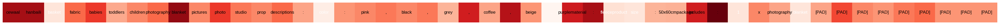

Prediction: Electronics


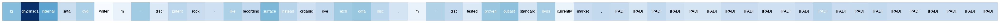

Prediction: Books


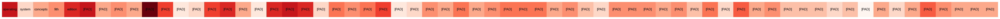

Prediction: Books


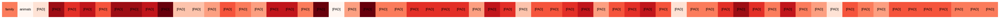

Prediction: Electronics


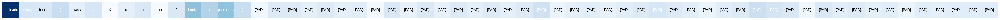

Prediction: Books


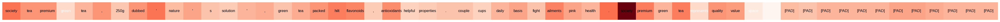

Prediction: Books


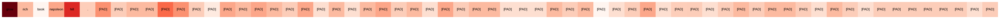

Prediction: Electronics


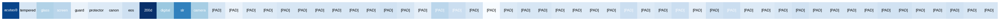

Prediction: Electronics


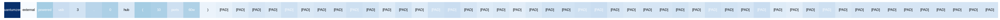

Prediction: Books


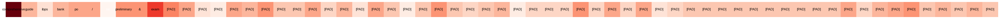

Prediction: Books


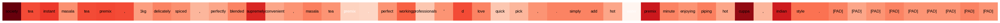

Prediction: Electronics


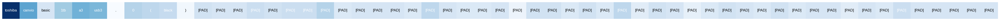

Prediction: Books


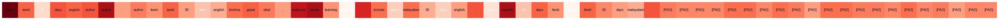

Prediction: Books


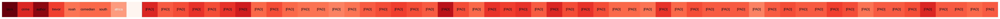

Prediction: Books


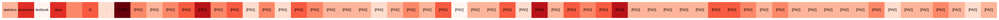

Prediction: Electronics


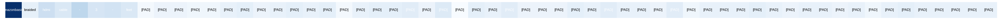

Prediction: Electronics


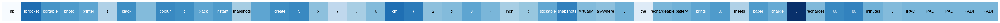

Prediction: Books


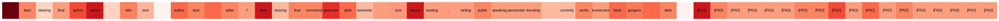

Prediction: Electronics


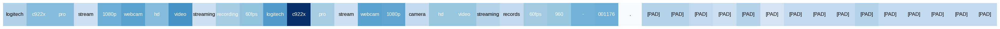

Prediction: Books


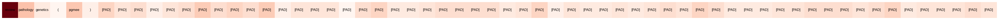

Prediction: Books


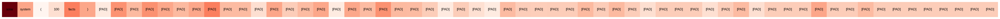

Prediction: Books


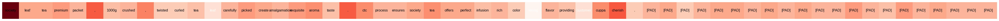

Prediction: Books


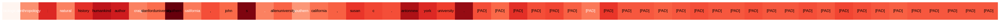

Prediction: Books


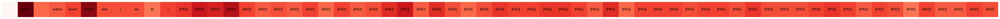

Prediction: Books


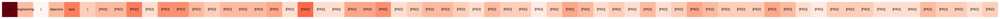

Prediction: Electronics


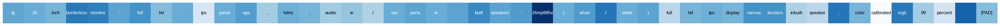

Prediction: Books


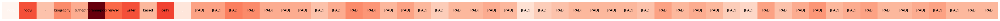

Prediction: Books


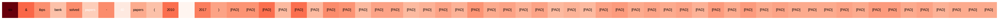

Prediction: Books


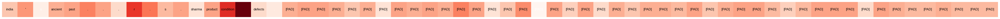

Prediction: Electronics


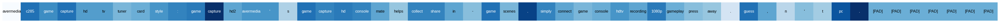

Prediction: Electronics


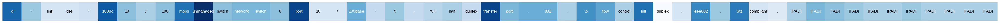

Prediction: Electronics


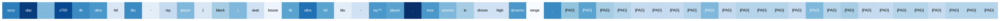

Prediction: Books


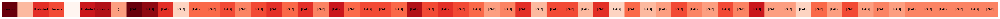

Prediction: Electronics


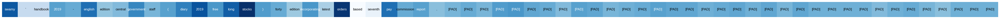

Prediction: Books


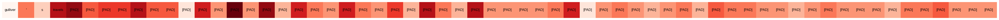

Prediction: Electronics


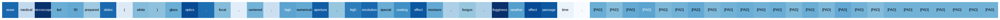

Prediction: Books


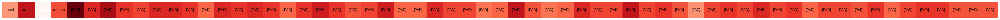

Prediction: Books


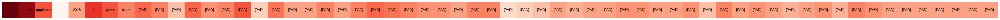

Prediction: Books


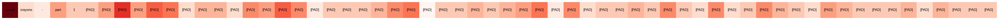

Prediction: Books


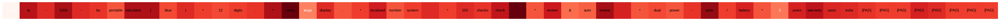

Prediction: Electronics


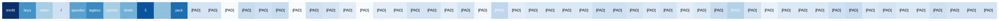

Prediction: Books


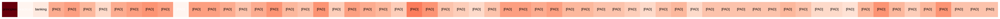

Prediction: Electronics


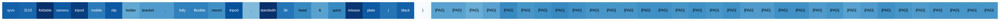

Prediction: Electronics


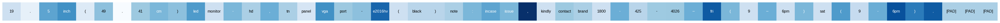

Prediction: Books


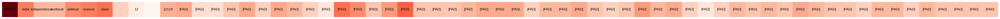

Prediction: Books


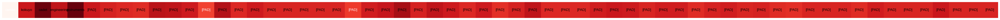

Prediction: Books


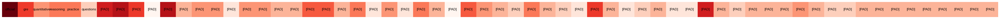

Prediction: Books


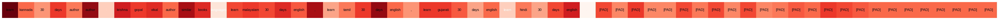

Prediction: Electronics


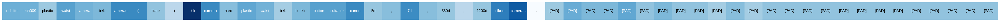

Prediction: Books


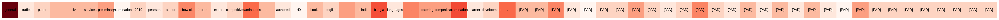

Prediction: Books


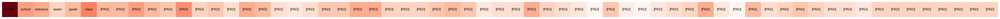

Prediction: Books


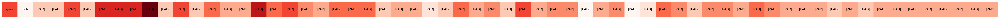

Prediction: Books


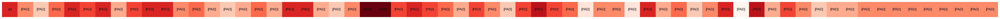

Prediction: Books


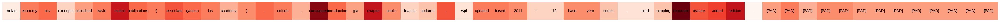

Prediction: Books


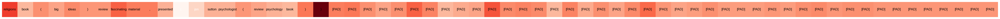

Prediction: Books


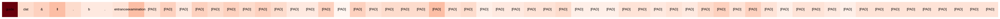

Prediction: Books


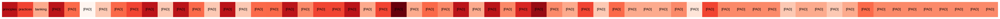

Prediction: Books


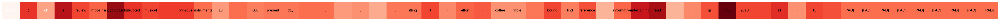

Prediction: Books


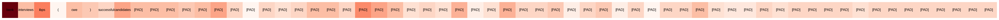

Prediction: Electronics


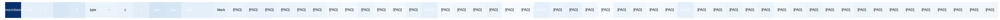

Prediction: Electronics


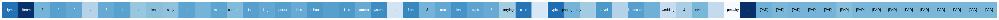

Prediction: Books


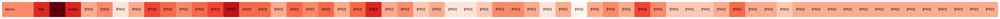

Prediction: Books


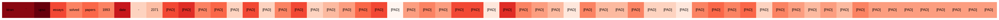

Prediction: Electronics


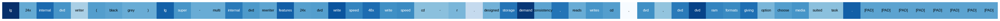

Prediction: Books


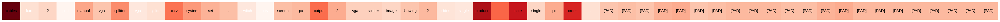

Prediction: Electronics


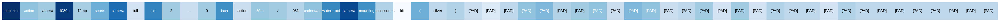

In [40]:
for x in range(len(sentences)):
  fig, ax = plt.subplots(figsize=(len(sentences[x]), 1))
  if prediction_model(np.array([to_explain[x]]))[0] == 0:
    print("Prediction: Books")
    ax.imshow([sentence_explanations[x]], cmap="Reds", aspect="auto")
    ax.axis("off")
    for i, word in enumerate(sentences[x]):
      color = plt.cm.Blues(sentence_explanations[x][i])
      ax.text(i, 0, word, ha="center", va="center", fontsize="12", color="white" if sentence_explanations[x][i] < -0.02 else "black")#color="white" if heatmaps[x][i] > 0.5 else "black", bbox=dict(facecolor=color, edgecolor=color, pad=1))
  else:
    print("Prediction: Electronics")
    ax.imshow([sentence_explanations[x]], cmap="Blues", aspect="auto")
    ax.axis("off")
    for i, word in enumerate(sentences[x]):
      color = plt.cm.Blues(sentence_explanations[x][i])
      ax.text(i, 0, word, ha="center", va="center", fontsize="12", color="white" if sentence_explanations[x][i] > 0.02 else "black")#color="white" if heatmaps[x][i] > 0.5 else "black", bbox=dict(facecolor=color, edgecolor=color, pad=1))


  plt.show()

In [41]:
def ablate(x, i):
  x[i] = 0
  for j in range(i, len(x)-1):
    x[j] = x[j+1]
  x[-1] = 0
  return x
def compute_contrast(X, model, explanation):
  contrast = [0]*len(X)
  for i in range(len(X)):
    old_prediction = model(np.array([X[i]]))
    for j in range(len(X[i])):
      x = ablate(copy.deepcopy(X[i]), j)
      new_prediction = model(np.array([x]))
      if (new_prediction != old_prediction):
        contrast[i] += explanation[i][j]
  return contrast

In [42]:
def compute_distinctiveness(data, train_data, explanation):
  distinctiveness = [0] * len(data)

  frequencies = []
  for x in np.unique(train_data):
    frequencies.append((np.mean(np.array(train_data) == x), x))
  sorted_frequencies = sorted(frequencies)
  word_specialty = {0: 0}
  for i, (f, x) in enumerate(sorted_frequencies):
    word_specialty[x] = 1 - i / len(sorted_frequencies)

  for i in range(len(data)):
    for j in range(len(data[i])):
      try:
        distinctiveness[i] += word_specialty[data[i][j]] * explanation[i][j]
      except:
        distinctiveness[i] += explanation[i][j]

  return distinctiveness

In [43]:
def compute_fidelity(X, explanation, model):
    fidelity = [0] * len(X)
    samples = 5
    for i in range(len(X)):
        change_ratings = [0]*len(X[i])
        x = 0
        while x < len(X[i]):
            change_rating = 0
            for change in range(samples):
                new_X = copy.deepcopy(X[i])
                new_X[x] = new_X[x] + (100 * change / samples)
                if (model(np.array([X[i]])) == model(np.array([new_X]))):
                    change_rating += 1/samples
            change_ratings[x] = change_rating
            if (X[i][x] == 0):
                x = len(X[i])
            x += 1
            
        for j in range(len(X[i])):
            fidelity[i] += change_ratings[j] * explanation[i][j]
    return fidelity

In [44]:
from nltk.corpus import wordnet as wn
def compute_realism(sentences, explanation, positive_words, negative_words, positive):
    """
    data: the word ids in the shape of #elements x #words
    topic: a wordnet synset
    id_to_token: a function from ids to tokens

    returns an array of length #elements
    """
    metrics = [0] * len(sentences)
    for i in range(len(sentences)):
        if (positive[i] == 1):
            for j in range(len(sentences[i])):
                vals = [0]
                for w in positive_words:
                    try:
                        vals.append(w.wup_similarity(wn.synsets(sentences[i][j])[0]))
                    except:
                        pass
                metrics[i] += explanation[i][j] * np.max(vals)
        else:
            for j in range(len(sentences[i])):
                vals = [0]
                for w in negative_words:
                    try:
                        vals.append(w.wup_similarity(wn.synsets(sentences[i][j])[0]))
                    except:
                        pass
                metrics[i] += explanation[i][j] * np.max(vals)
    return metrics

In [46]:
def compute_compactness(explanations):
    """
    Calculate the compactness based on the number of outliers in a list of numeric data points, using the interquartile range (IQR) method.
    """
    results = []
    for data in explanations:
      q1, q3 = np.percentile(data, [0, 100])
      iqr = q3 - q1
      upper_bound = q3 - (0.4 * iqr)
      outliers = len([x for x in data if x > upper_bound])
      if outliers == 0:
        results.append(0)
      else:
        results.append(max(0, 1.25 - (0.25 * outliers)))
    return results

In [47]:
contrast = compute_contrast(to_explain, prediction_model, standardized_explanations)
print(contrast)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.39453124999999994, 0, 0.609375, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.17890624999999996, 0, 0, 0.521875, 0, 0, 0.16171875000000002, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.14348958333333334, 0, 0, 0, 0.06380208333333331, 0, 0, 0, 0, 0, 0.4692708333333333, 0.001822916666666662, 0, 0, 0, 0, 0.39375000000000004, 0, 0, 0, 0, 0.6062500000000001, 0, 0.21874999999999994, 0, 0, 0, 0, 0.024999999999999988, 0, 0, 0, 0, 0.40937499999999993, 0, 0.08046874999999999, 0, 0, 0, 0, 0, 0, 0.3765625, 0, 0, 0, 0, 0, 0.12656249999999997, 0, 0, 0.13671874999999997, 0.7140625, 0.09765625000000001]


In [48]:
distinctiveness = compute_distinctiveness(to_explain, X_train_padded, standardized_explanations)
print(distinctiveness)

[0.16066973286290318, 0.34938231816067034, 0.06921913771712167, 0.24365137445719606, 0.036799685949131584, 0.2943473266904467, 0.16951622596153842, 0.23383292299937977, 0.11511830218672461, -0.00884213128101738, 0.12427787686104226, 0.07922805521091819, 0.0659877578318859, 0.09279645820409431, 0.0015162162686104298, 0.05091016594292806, 0.21231074558002475, 0.12236521983560798, 0.0140164585918114, 0.11529859064826312, 0.13365408847704713, 0.26675519540942905, 0.0594445467586848, 0.010091549705335027, 0.15003659080334975, 0.17049400007754328, 0.06773248487903219, 0.0027537608560794058, 0.32644812344913154, 0.15834173387096767, 0.26034283886476417, 0.30710321999069456, 0.015027188663151345, 0.053712391439205885, 0.32765440834367254, 0.32274179008995024, 0.037510177574441625, -0.009847772565136439, 0.36181180210918124, 0.19060488717431762, 0.20018812357837035, 0.1255520122518612, 0.18786792739350708, 0.05133463541666663, 0.29510587908395375, 0.3248397435897433, 0.1833574848790321, 0.06168

In [49]:
positive = prediction_model(to_explain)
realism = compute_realism(
    sentences,
    sentence_explanations,
    [wn.synset("electronics.n.01"), wn.synset("technology.n.01"), wn.synset("electricity.n.01")],
    [wn.synset("book.n.01"), wn.synset("page.n.01"), wn.synset("paper.n.01"), wn.synset("study.v.01"), wn.synset("read.v.01")],
    positive
)
print(realism)

[0.061143363034508055, 0.2732191313709188, 0.15477724162581696, 0.22231541053921572, 0.09697916666666667, 0.18017378225328595, 0.26127461220866555, 0.0962048100490196, 0.0, -0.0451171875, 0.10682019101711197, 0.034317555147058816, 0.020546875, 0.12372305492709905, 0.06786534926470587, 0.17571410430948697, 0.03748449900793651, 0.11710044576542737, 0.04192424242424242, 0.066796875, 0.18116401508520075, 0.20735188899910506, 0.0030361519607843158, 0.027851562499999996, 0.04970588427256867, 0.04211145554236189, 0.0809443176308985, 0.040646339465273296, 0.21489334150917455, 0.10090773809523812, 0.12195075757575759, 0.16314490688619948, 0.10055726978291317, 0.025424808035102144, 0.15555015232096547, 0.10915507439864056, 0.058833377100840335, -0.00408350840336135, 0.0648797487745098, 0.27562074924666835, 0.07774212549603174, 0.05633585164835166, 0.025801113714716654, 0.0820846579635642, 0.31287389987624614, 0.019626991421568627, 0.22614272464202326, 0.08008451788311016, 0.0232001342203548, 0.0

In [50]:
fidelity = compute_fidelity(to_explain, standardized_explanations, prediction_model)
print(fidelity)

[0.5179687500000001, 0.8515625, 0.73515625, 0.9085937500000002, 0.18984375, 0.73453125, 0.8093749999999997, 0.66296875, 0.13171875, -0.08671875, 0.53265625, 0.75234375, 0.26265625, 0.8125, 0.4912499999999999, 0.8585937499999999, 0.32187499999999997, 0.55078125, 0.14296875, 0.17343750000000002, 0.9210937500000003, 0.7593749999999999, 0.07968750000000001, 0.11796875, 0.45843750000000005, 0.18546875000000002, 0.5139062499999999, 0.9895312499999998, 0.7815625000000002, 0.7515625, 0.7820312500000001, 0.6432812499999999, 0.8523437500000001, 0.21796875, 0.81859375, 0.77625, 0.16093749999999998, -0.013281250000000017, 0.5410937499999999, 0.8695312500000002, 0.27109375, 0.7722916666666668, 0.6824479166666667, 0.3885416666666667, 0.9104166666666665, 0.6423437500000001, 0.6681770833333331, 0.1030729166666667, 0.19505208333333335, 0.5500520833333333, 0.9781249999999997, 0.7523437499999999, 0.9323437500000001, 0.3330729166666666, 0.19609375000000004, 0.7385416666666664, 0.40916666666666657, 0.10468

In [51]:
compactness = compute_compactness(standardized_explanations)
print(compactness)

[1.0, 0, 0, 0, 0, 0, 0.75, 0, 1.0, 0, 1.0, 1.0, 0.75, 0, 0.75, 0, 1.0, 0, 0, 1.0, 0, 0, 0.5, 0, 0, 0.75, 1.0, 0, 0, 0, 1.0, 0.25, 1.0, 0.75, 0, 0, 0, 0, 1.0, 1.0, 0.75, 0.5, 0, 0.75, 0, 0, 0, 0, 0, 1.0, 0, 0, 0, 1.0, 1.0, 1.0, 0, 0, 1.0, 0, 0, 1.0, 0.5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.75, 0, 0.25, 1.0, 0, 0, 1.0, 0, 0, 0, 0, 1.0, 1.0, 0, 0, 0.25, 0.75, 1.0, 0, 0, 1.0, 1.0, 0, 0, 0, 0, 0.25, 0]
